In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import mplcursors
import time
from scipy import integrate
import seaborn as sns
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from astropy.io import ascii

next 2 cells calculate the integrals from the clicks and create a csv file of the info

In [ ]:
# df = pd.read_csv(r'C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra\ZTF18aabstmw_20180307_LCO-FLOYDS_0_dereddened.csv')
# fl = np.array(df['fl'])
# wl = np.array(df['wl'])/(1+0.02308648)
# normalise_band  = np.where( np.logical_and(wl>=6900, wl<=7100))
# median_flux = np.median(fl[normalise_band])
# mad_flux = np.median(np.abs(fl[normalise_band] - median_flux))
# if mad_flux != 0:
#     normalized_flux = fl / mad_flux
# else: normalized_flux = np.nan * fl

In [2]:
# Functions to normalize the flux
def normalize_flux(flux, method='min-max'):
    if method == 'min-max':
        return np.abs((flux - np.min(flux)) / (np.max(flux) - np.min(flux)))
    elif method == 'z-score':
        return np.abs((flux - np.mean(flux)) / np.std(flux))
    #elif method == 'area':
    #    area = simps(flux, wavelength)
        return flux / area
    elif method == 'peak':
        return np.abs(flux / np.max(flux))
    elif method == 'mean':
        return np.abs(np.mean(flux))
    else:
        raise ValueError("Normalization method not recognized")

ZTF18aabstmw_20180307_LCO-FLOYDS_0_dereddened.csv


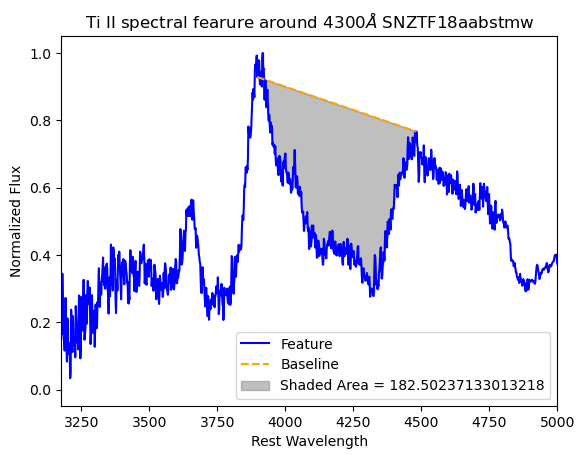

ZTF18aabstmw_20180307_SEDm_0_dereddened.csv


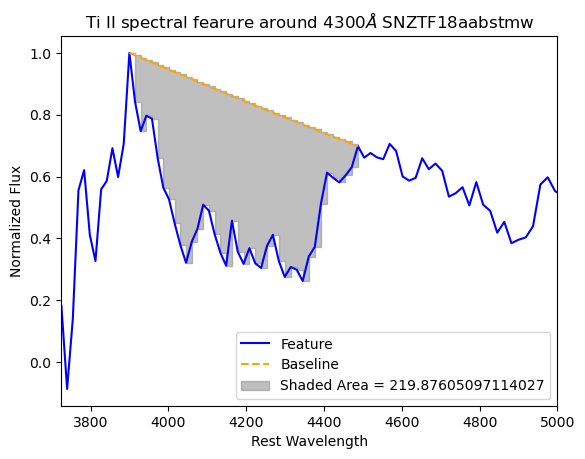

ZTF18aauizcr_20180519_SEDm_0_dereddened.csv


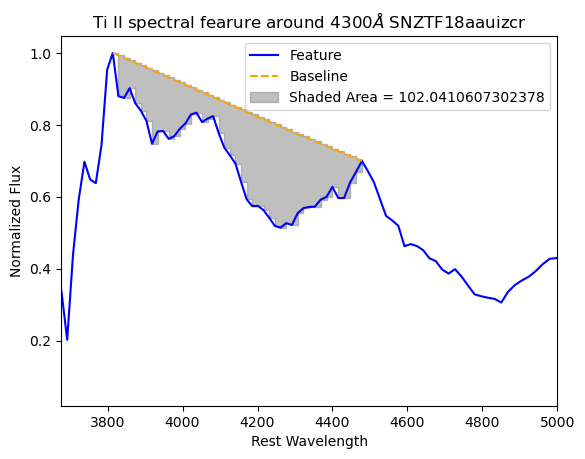

ZTF18aaxdrjn_20180531_SEDm_0_dereddened.csv


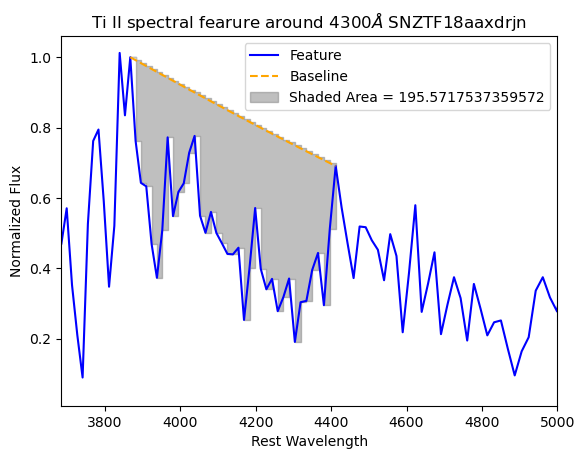

ZTF18aaxdrjn_20180603_LT_0_dereddened.csv


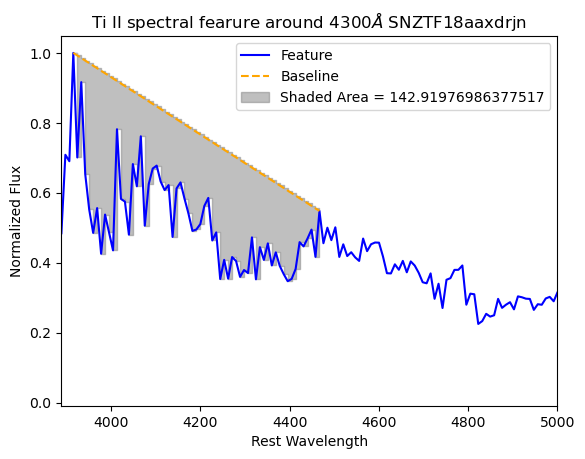

ZTF18absnqyo_20180908_SEDm_0_dereddened.csv


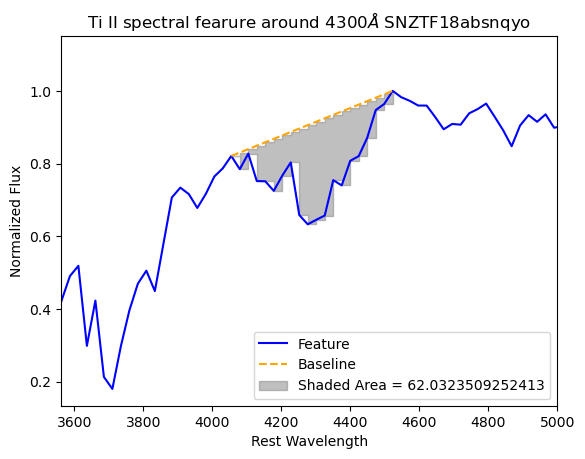

ZTF18abupgql_20180913_P200_0_dereddened.csv


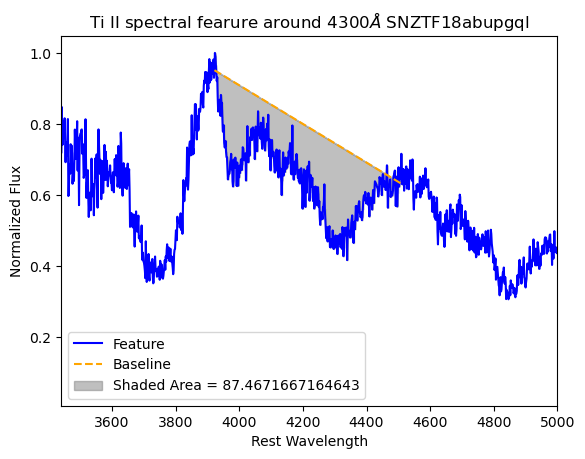

ZTF18abvejbm_20180914_SEDm_0_dereddened.csv


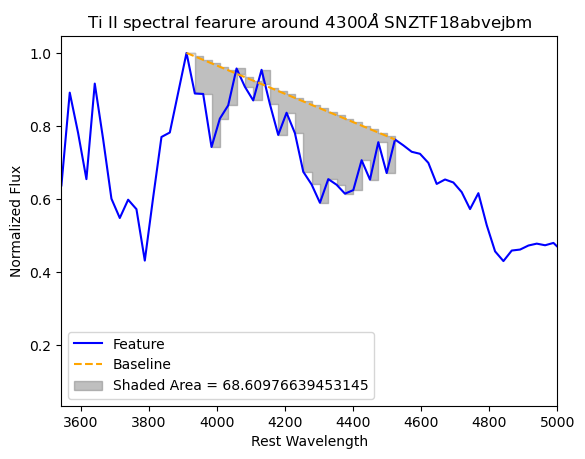

ZTF18acbvgqw_20181104_SEDm_0_dereddened.csv


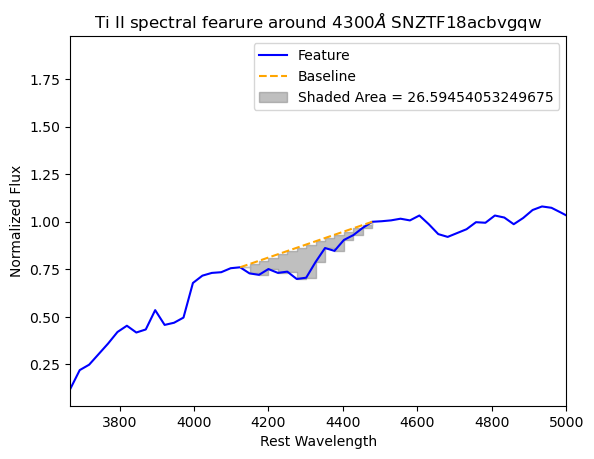

ZTF18acehilk_20181108_SEDm_0_dereddened.csv


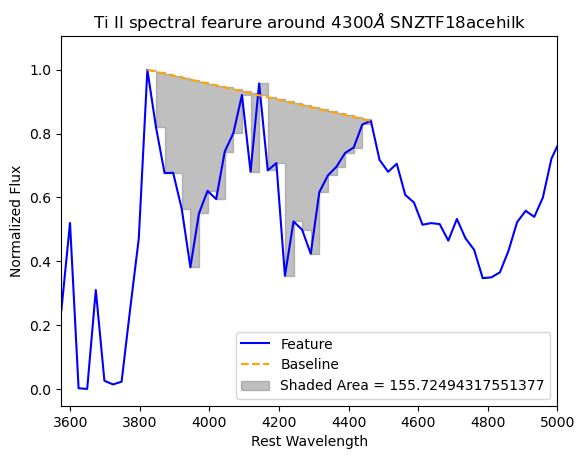

ZTF18achbllm_20181113_SEDm_0_dereddened.csv


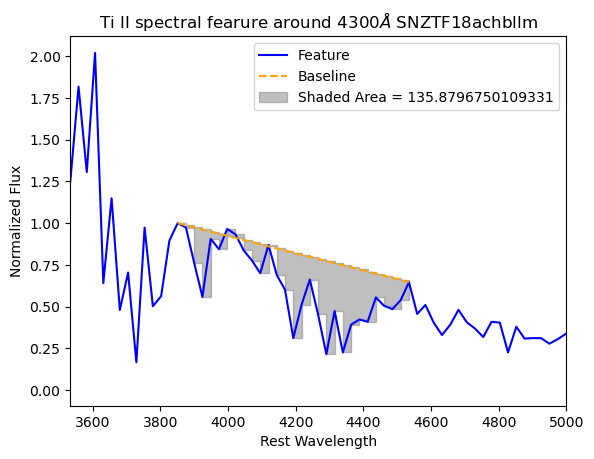

ZTF18achbllm_20181115_SEDm_0_dereddened.csv


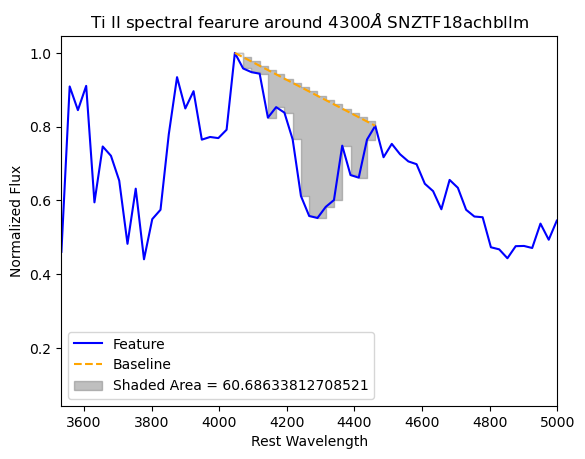

ZTF18acsyzca_20181206_LCO-FLOYDS_0_dereddened.csv


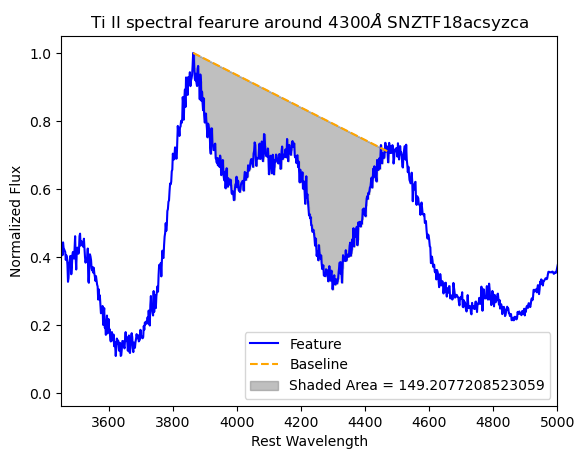

ZTF18acvrfvv_20181219_SEDm_0_dereddened.csv


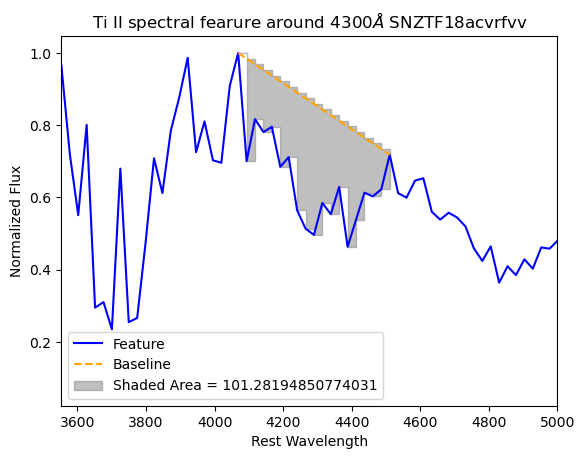

ZTF19aakizps_20190209_NTT_0_dereddened.csv


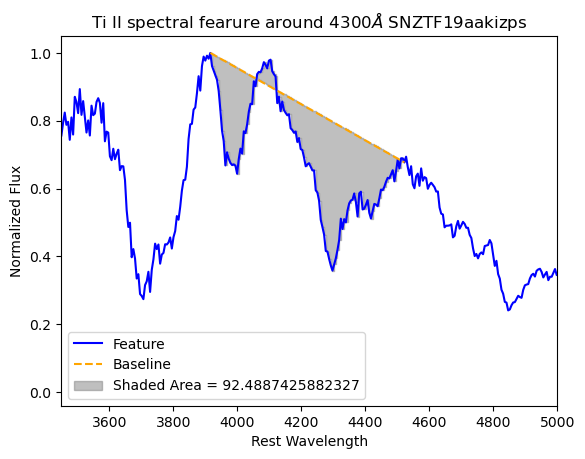

ZTF19aaklqod_20200214_SEDm_0_dereddened.csv


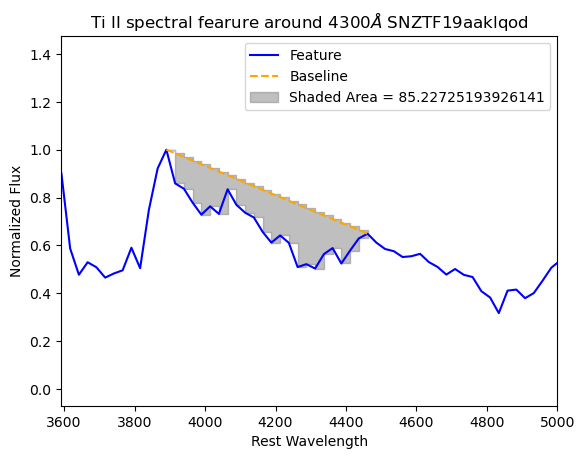

ZTF19aanhgqg_20190325_SEDm_0_dereddened.csv


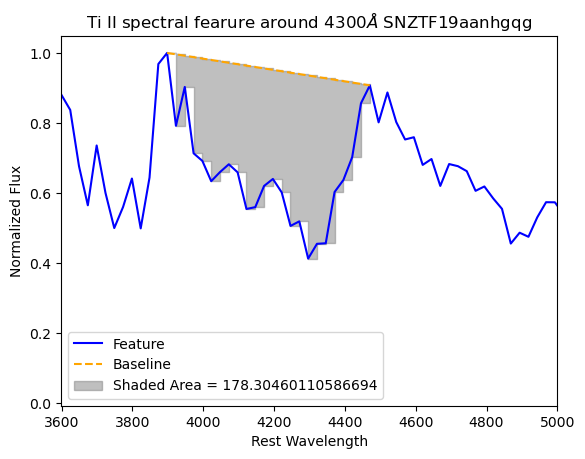

ZTF19aanhgqg_20190326_SEDm_0_dereddened.csv


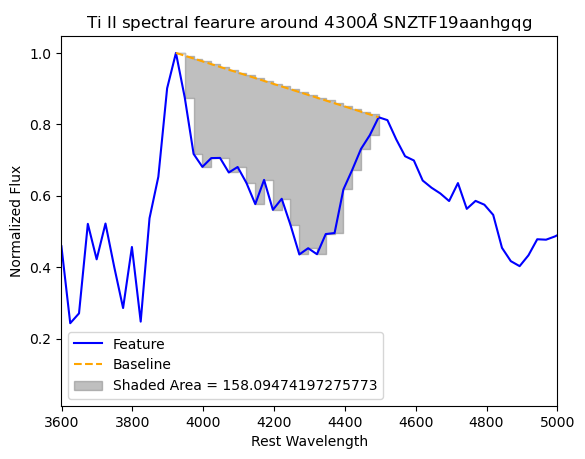

ZTF19aauhwbp_20190513_SEDm_0_dereddened.csv


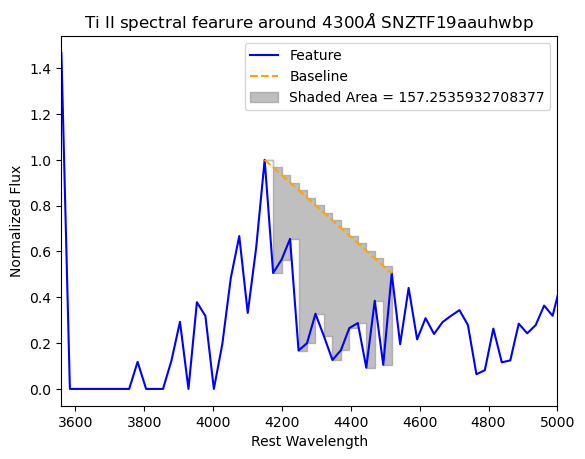

ZTF19aavrswr_20190603_SEDm_0_dereddened.csv


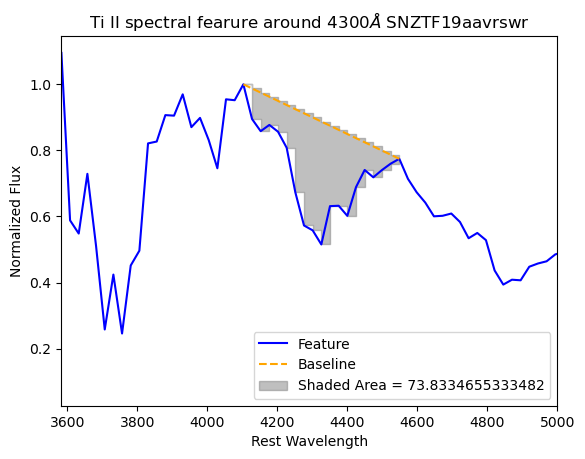

ZTF19abbytxa_20190629_SNIFS_0_dereddened.csv


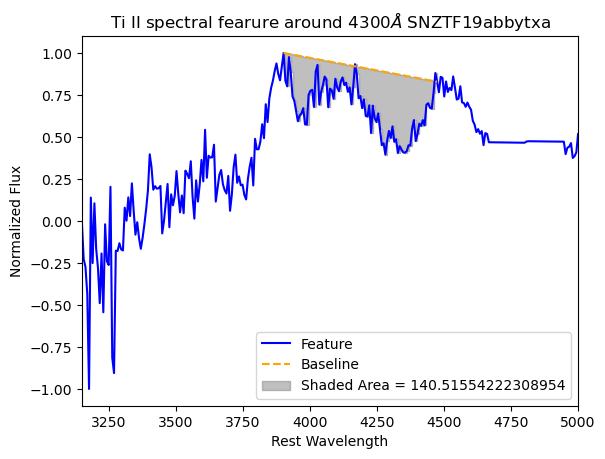

ZTF19abdrwsz_20190711_SEDm_0_dereddened.csv


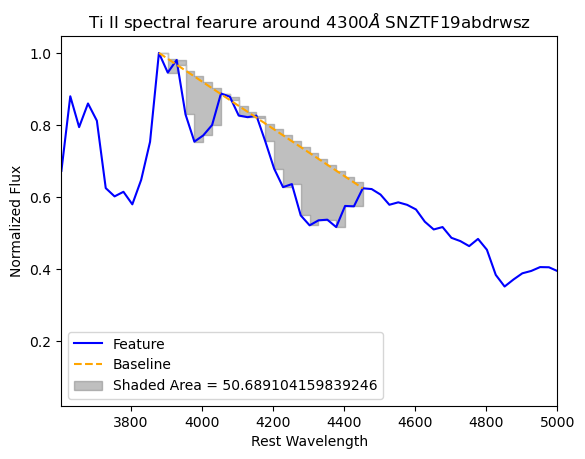

ZTF19abetjcx_20190708_SEDm_0_dereddened.csv


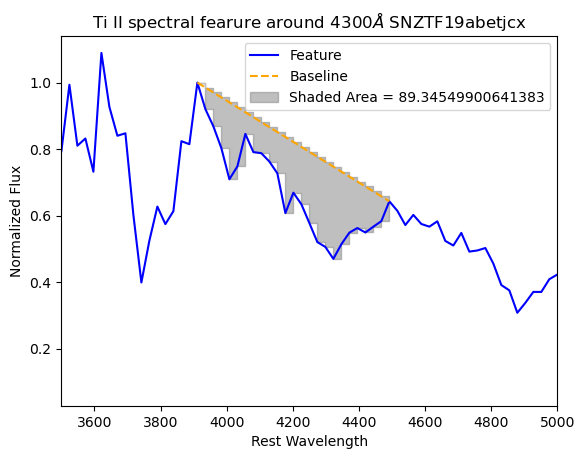

ZTF19abpbmli_20190816_SEDm_0_dereddened.csv


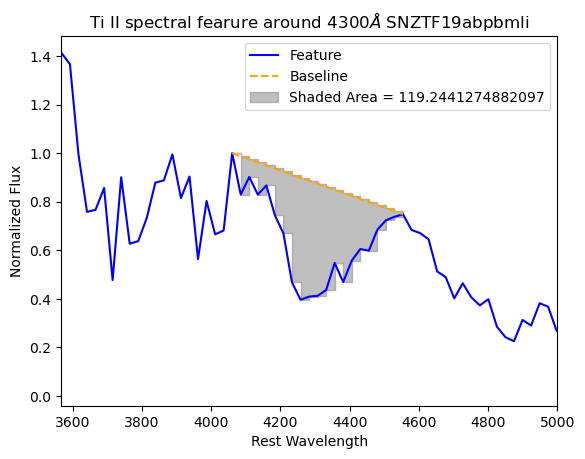

ZTF19abrogbl_20190828_SEDm_0_dereddened.csv


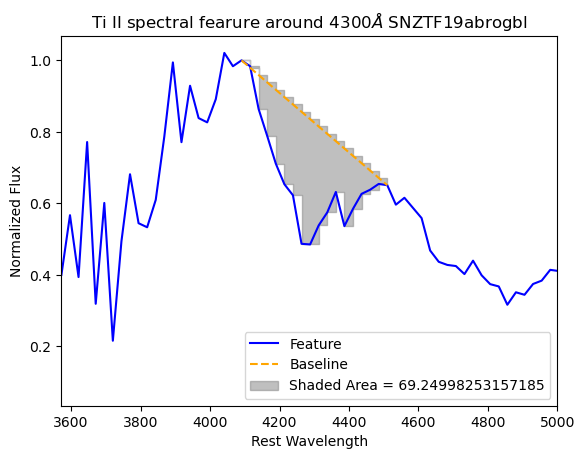

ZTF19abzlsbl_20190921_SEDm_0_dereddened.csv


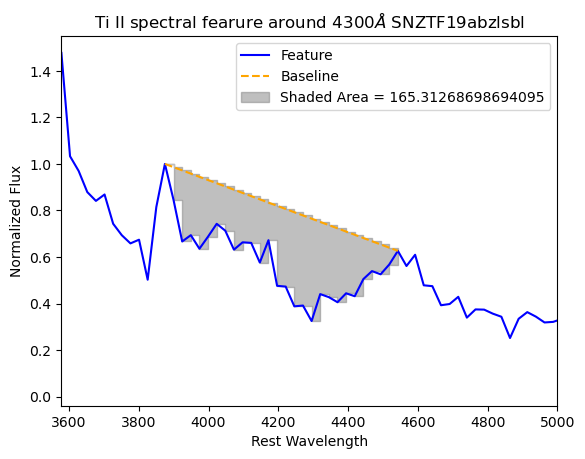

ZTF19aclofmz_20191105_SEDm_0_dereddened.csv


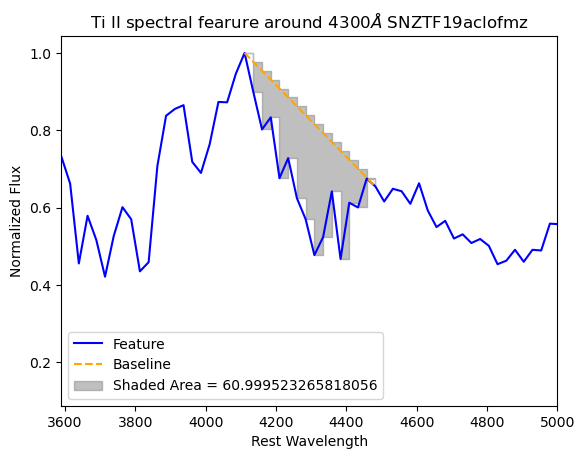

ZTF19acoxgqw_20191109_SEDm_0_dereddened.csv


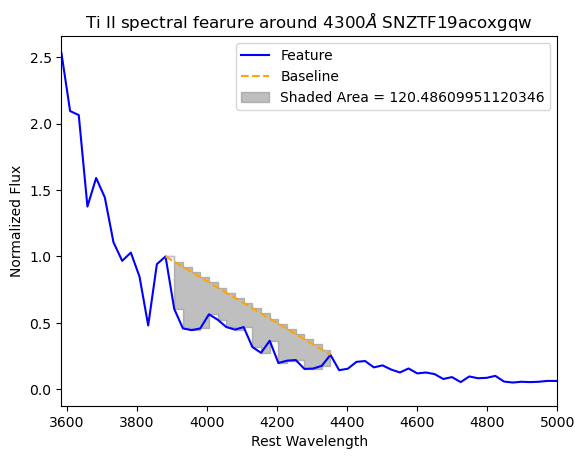

ZTF19acqehbt_20191112_SEDm_0_dereddened.csv


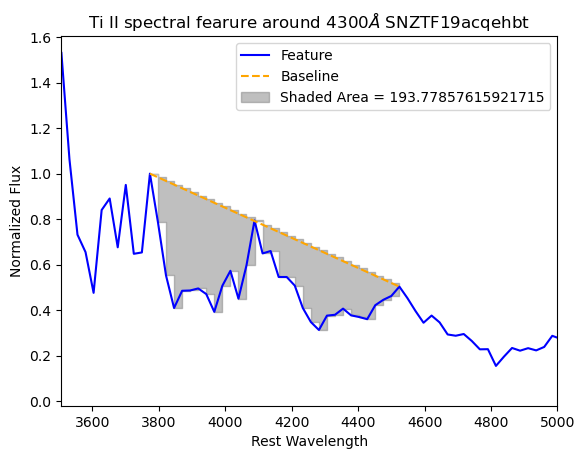

ZTF19acynije_20191220_LT_0_dereddened.csv


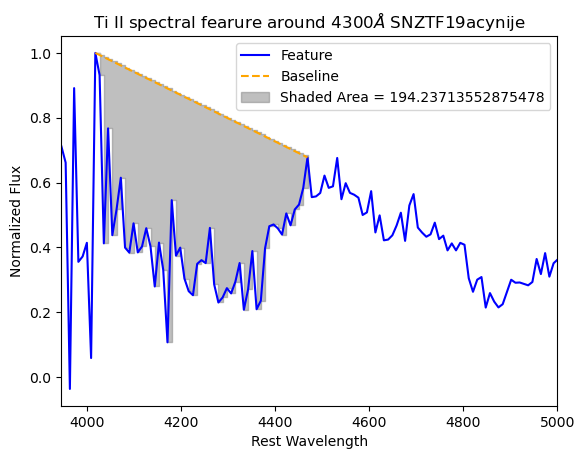

ZTF19adcdgca_20200102_SEDm_0_dereddened.csv


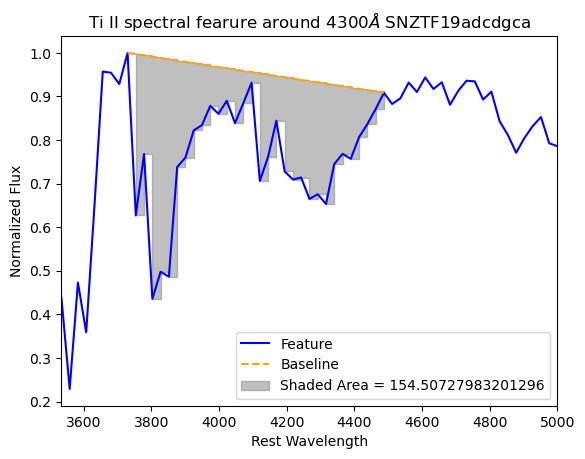

ZTF20aaaxacu_20200102_LT_0_dereddened.csv


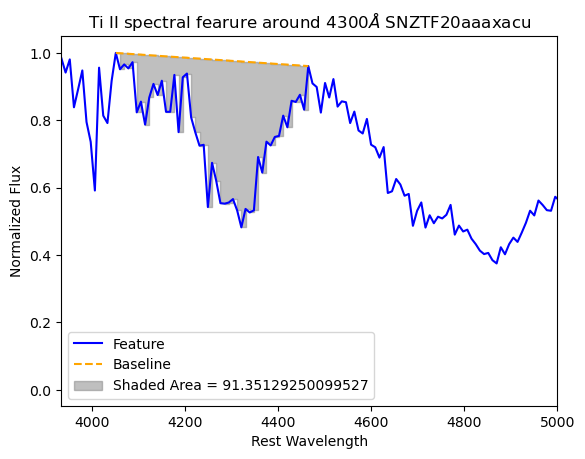

ZTF20aacevxq_20200107_SEDm_0_dereddened.csv


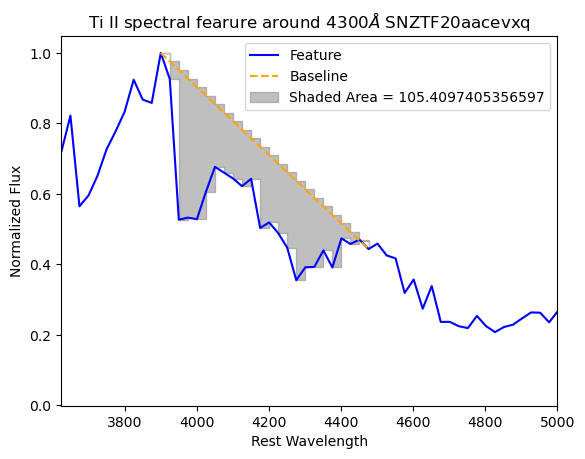

ZTF20aahqbib_20200128_SEDm_0_dereddened.csv


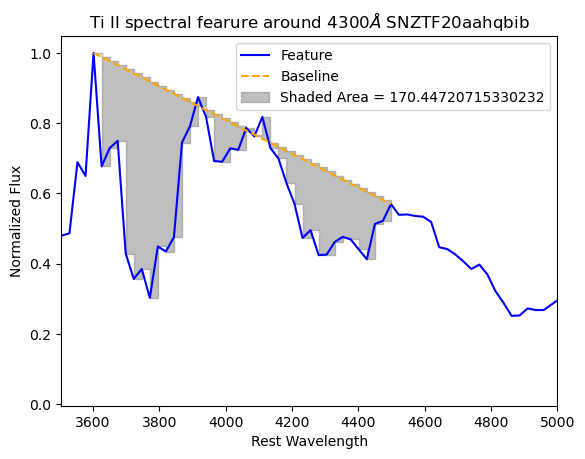

ZTF20aamkyyx_20200214_SEDm_0_dereddened.csv


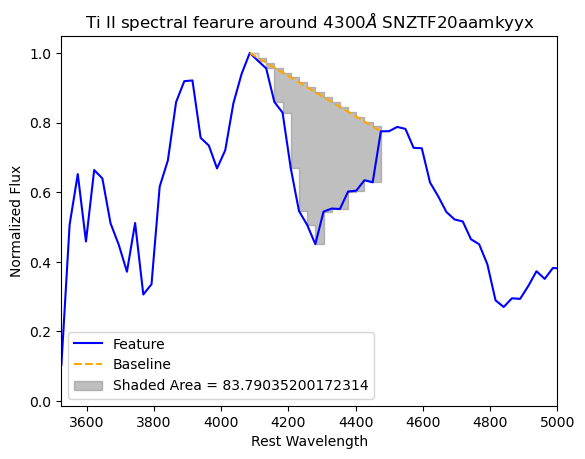

ZTF20aammhli_20200213_Lick-3m_0_dereddened.csv


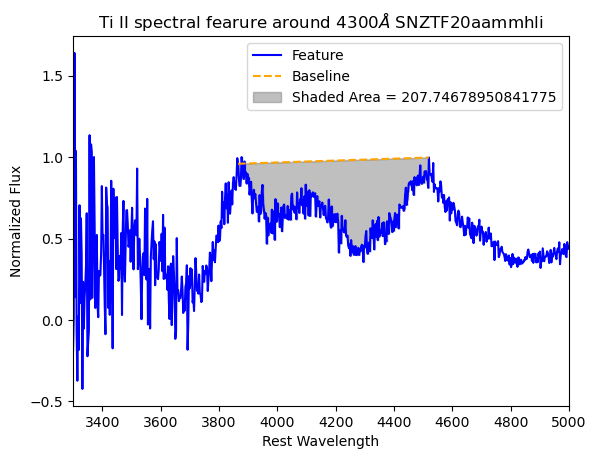

ZTF20aaodkvl_20200217_SEDm_0_dereddened.csv


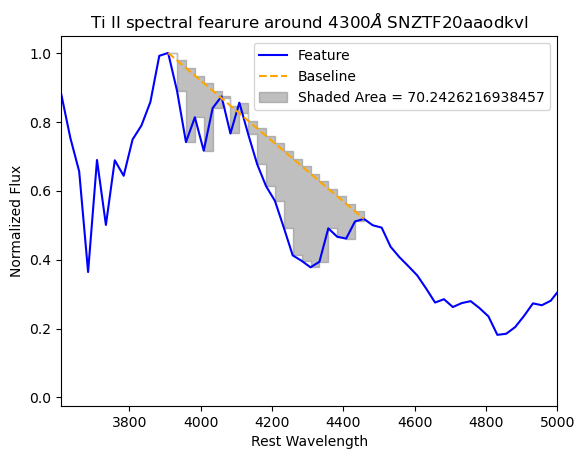

ZTF20aapcmur_20200225_SEDm_0_dereddened.csv


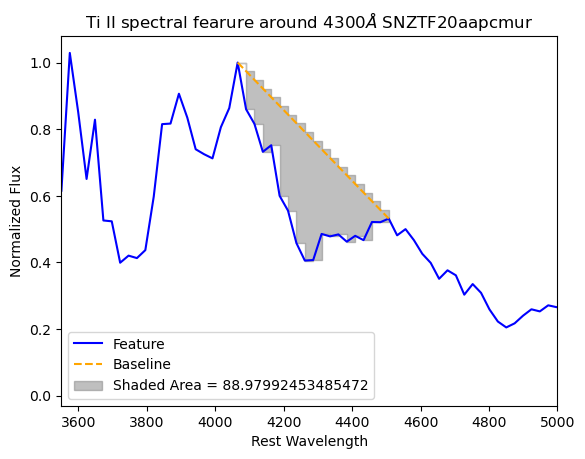

ZTF20aatvzmm_20200331_SEDm_0_dereddened.csv


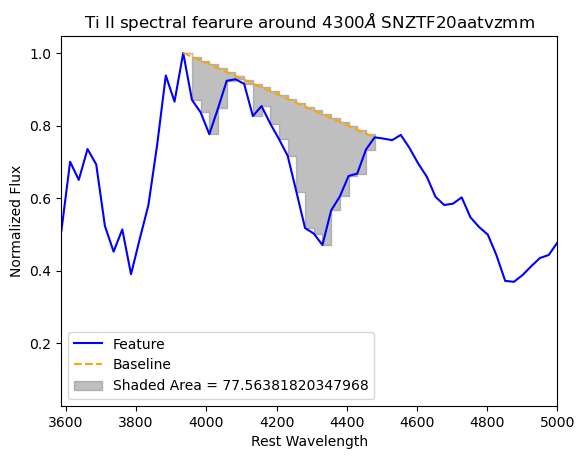

ZTF20aaumsrr_20200409_Other_0_dereddened.csv


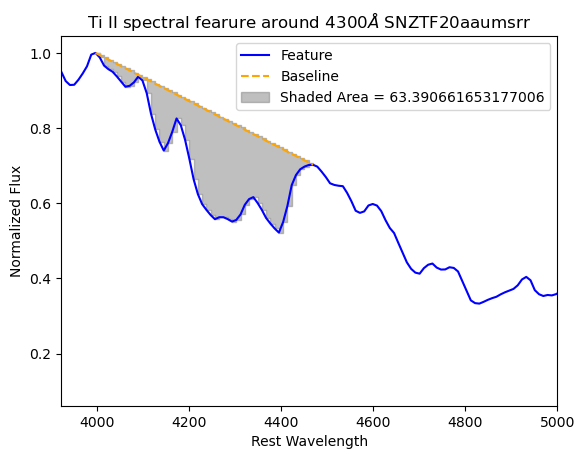

ZTF20aaurhzc_20200417_SEDm_0_dereddened.csv


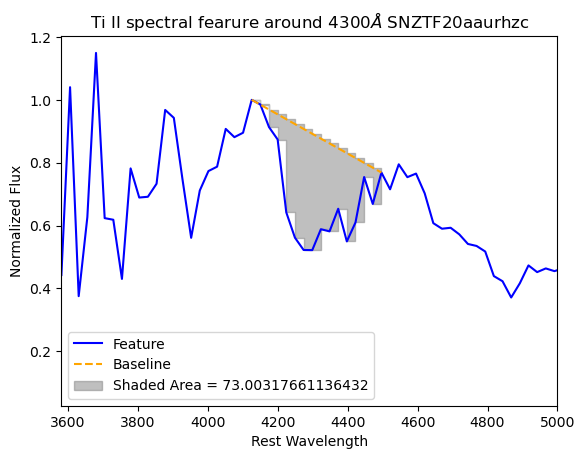

ZTF20aavnnat_20200424_SEDm_0_dereddened.csv


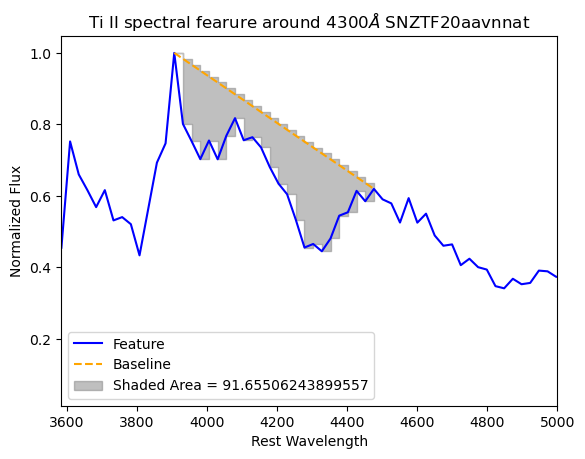

ZTF20aavrloz_20200425_SEDm_0_dereddened.csv


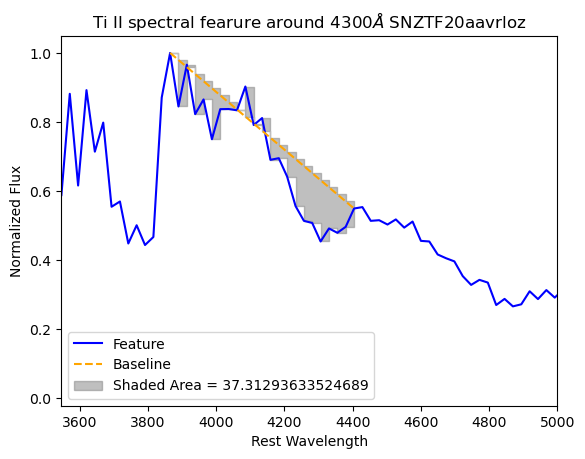

ZTF20aaymbjk_20200509_SEDm_0_dereddened.csv


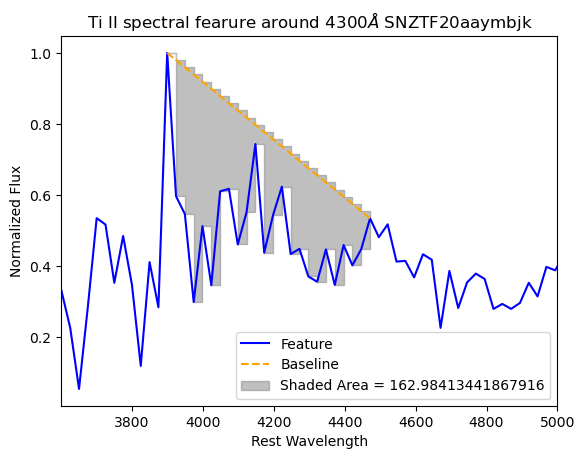

ZTF20aazgtmp_20200516_SEDm_0_dereddened.csv


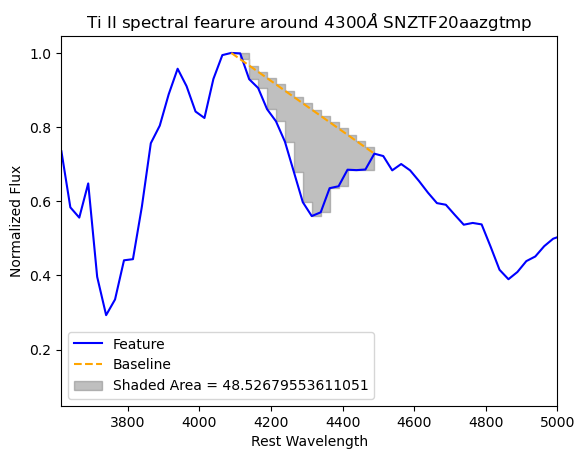

ZTF20aazhzna_20200516_SEDm_0_dereddened.csv


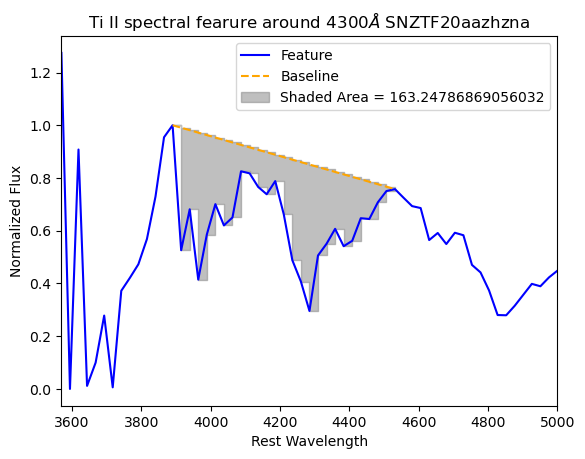

ZTF20aazkxcw_20200512_SEDm_1_dereddened.csv


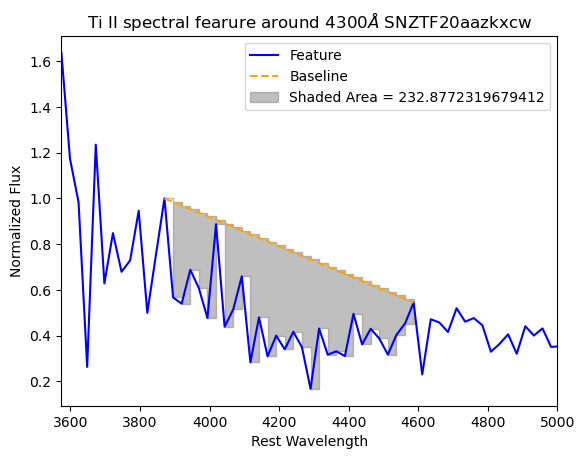

ZTF20abavxpk_20200525_SEDm_0_dereddened.csv


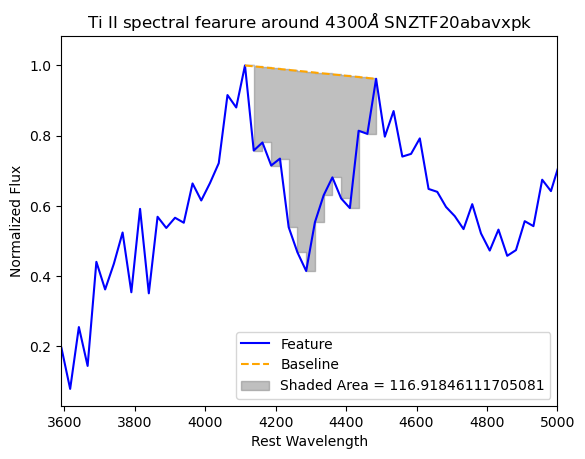

ZTF20abazekd_20200523_SEDm_0_dereddened.csv


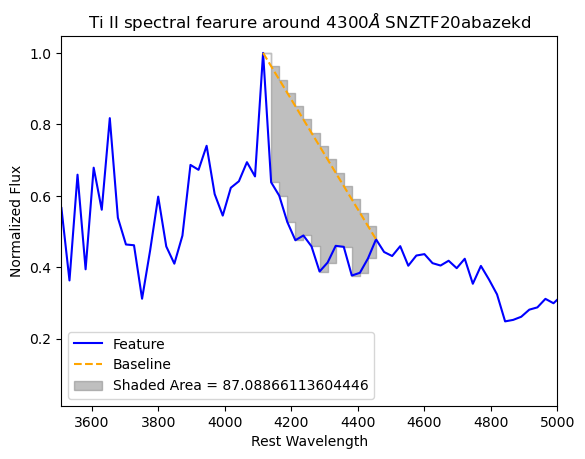

ZTF20abeeahl_20200609_SEDm_0_dereddened.csv


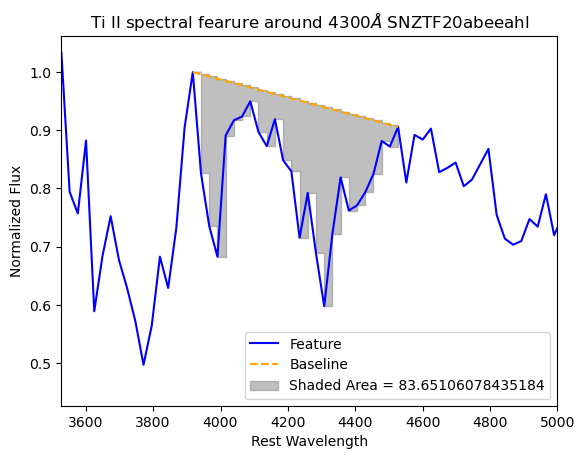

ZTF20abeeytg_20200613_SEDm_0_dereddened.csv


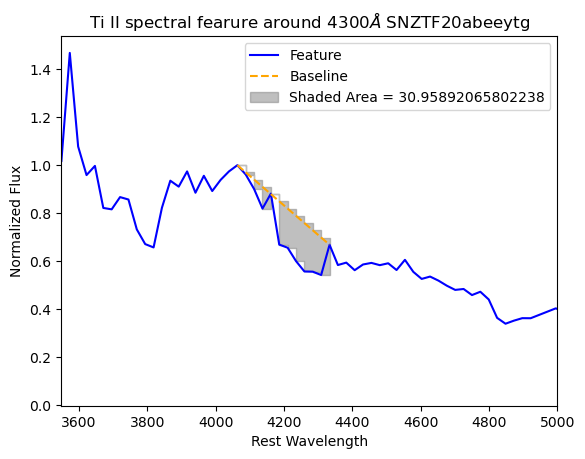

ZTF20abfhway_20200619_SEDm_0_dereddened.csv


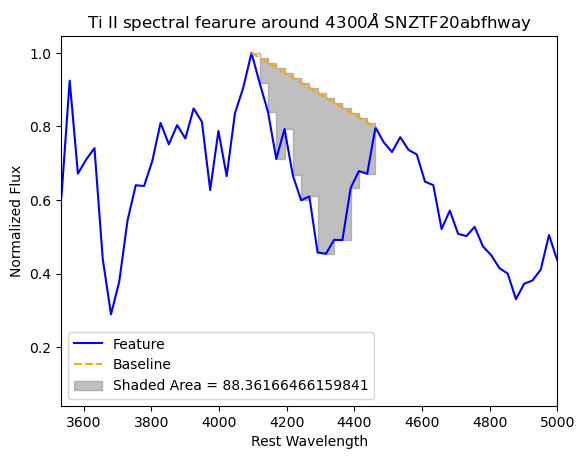

ZTF20abfsemq_20200622_SEDm_0_dereddened.csv


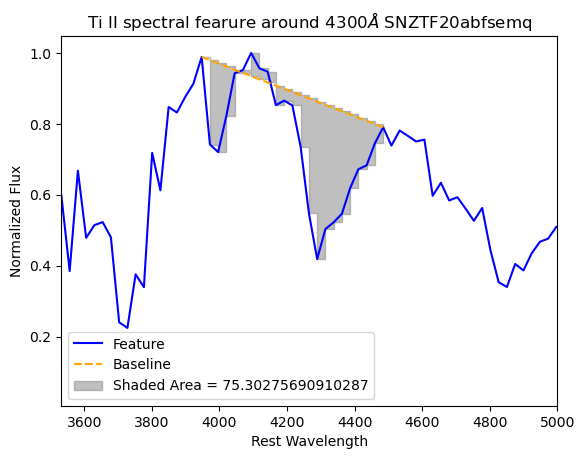

ZTF20abijfqq_20200625_LT_0_dereddened.csv


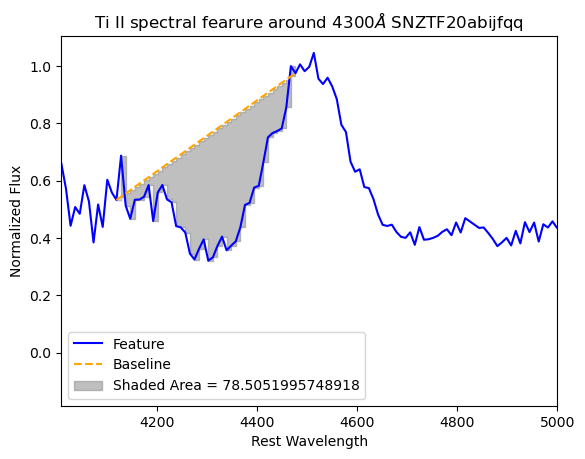

ZTF20ableiem_20200717_SEDm_0_dereddened.csv


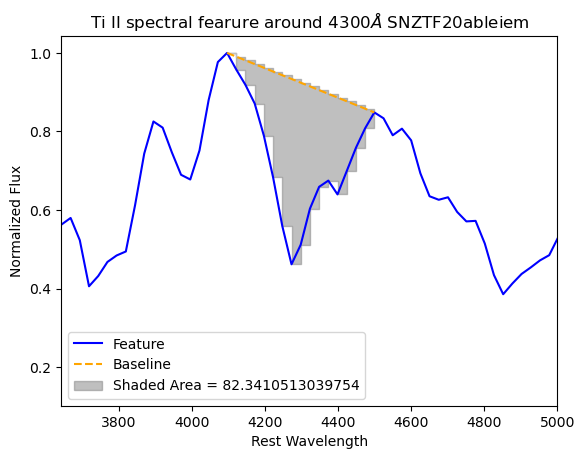

ZTF20abmoans_20200722_SEDm_0_dereddened.csv


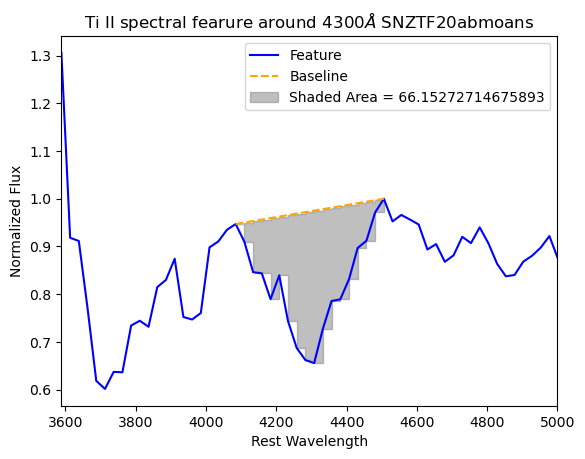

ZTF20abqbzuv_20200804_SEDm_0_dereddened.csv


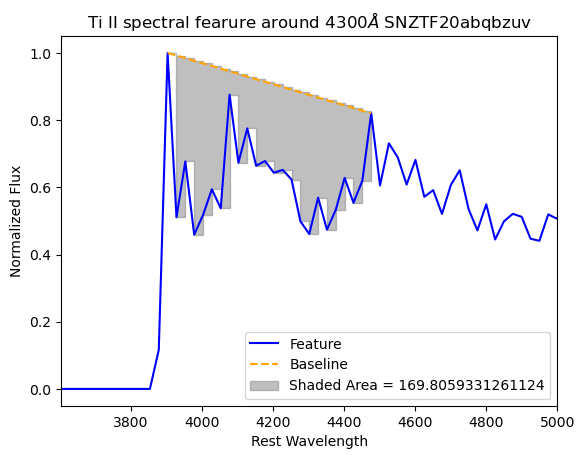

ZTF20abqmtsh_20200811_SEDm_0_dereddened.csv


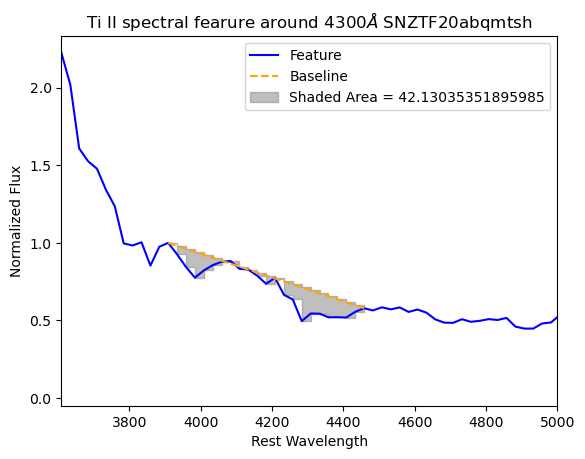

ZTF20abszyjg_20200821_SEDm_0_dereddened.csv


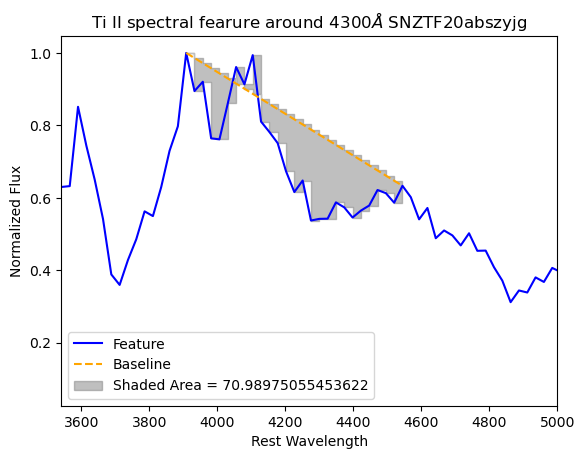

ZTF20abtctgr_20200817_GTC_0_dereddened.csv


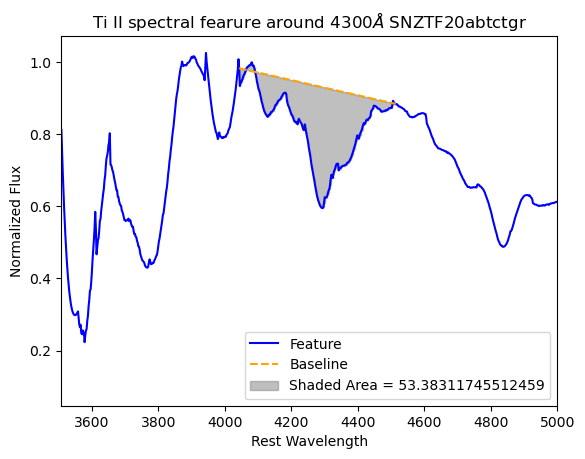

ZTF20abthxfr_20200820_SEDm_0_dereddened.csv


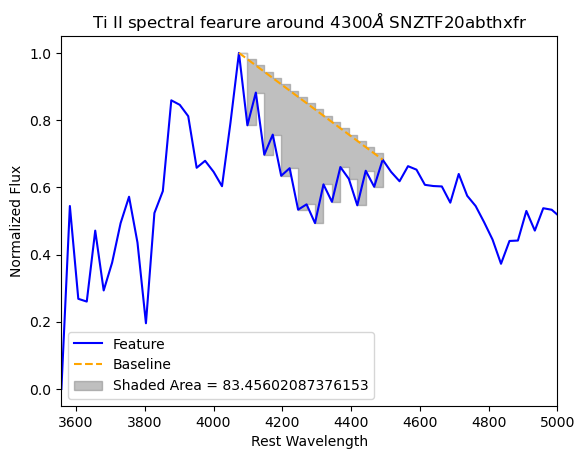

ZTF20acduffd_20200924_SEDm_0_dereddened.csv


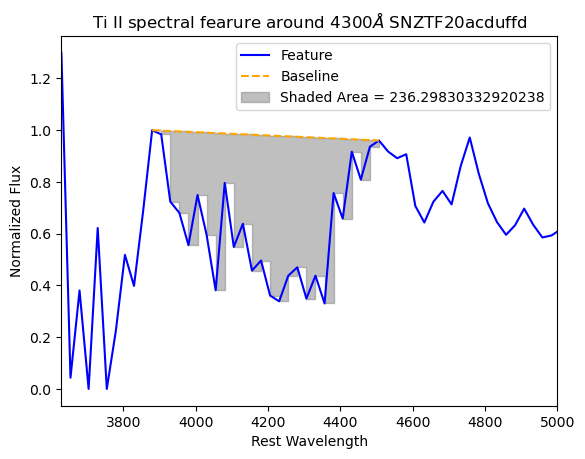

ZTF20acduffd_20200925_SEDm_0_dereddened.csv


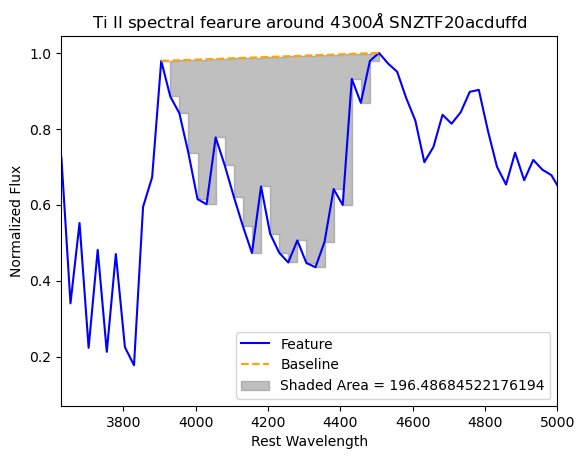

ZTF20acduffd_20200927_SEDm_0_dereddened.csv


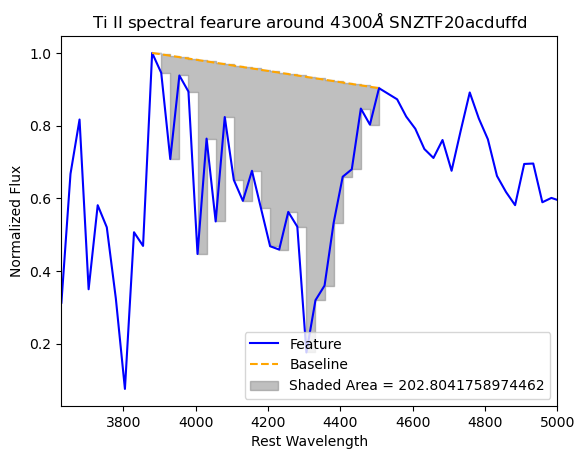

ZTF20acojxtb_20201105_NTT_0_dereddened.csv


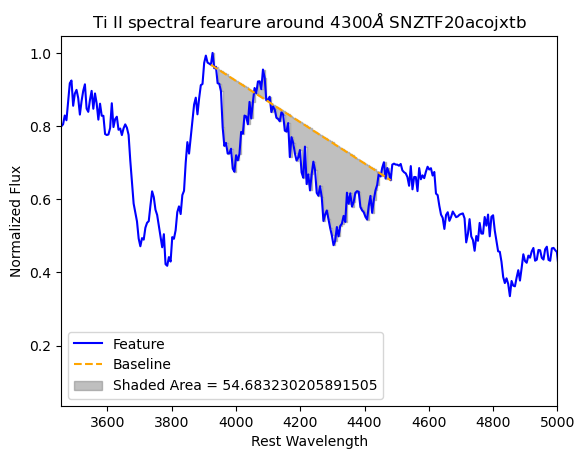

ZTF20acoyyly_20201110_SEDm_0_dereddened.csv


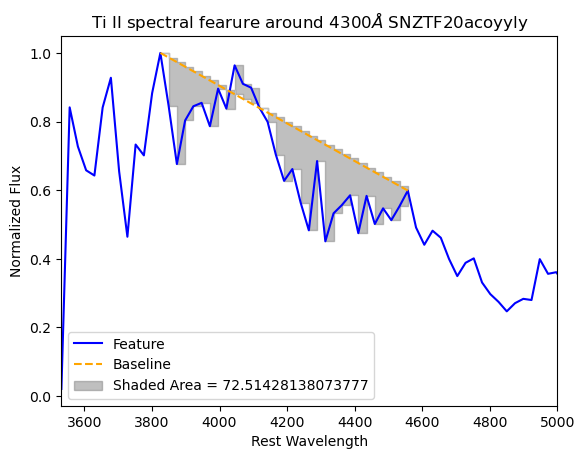

ZTF20acuosvy_20201202_SEDm_0_dereddened.csv


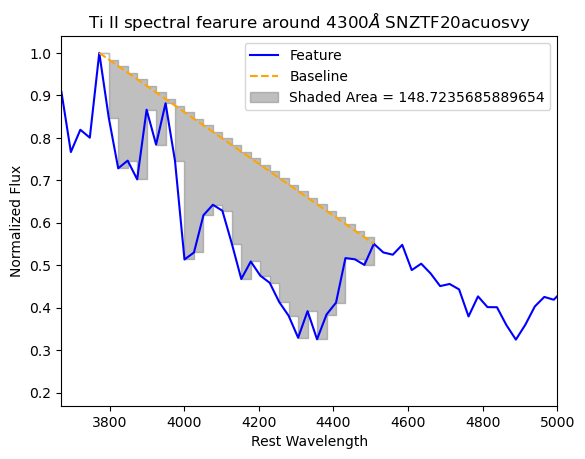

ZTF20acvziuf_20201210_CMO-2.5m_0_dereddened.csv


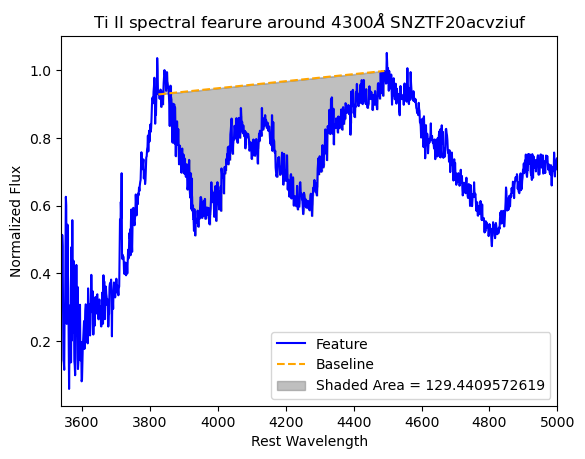

ZTF20acvziuf_20201210_SEDm_0_dereddened.csv


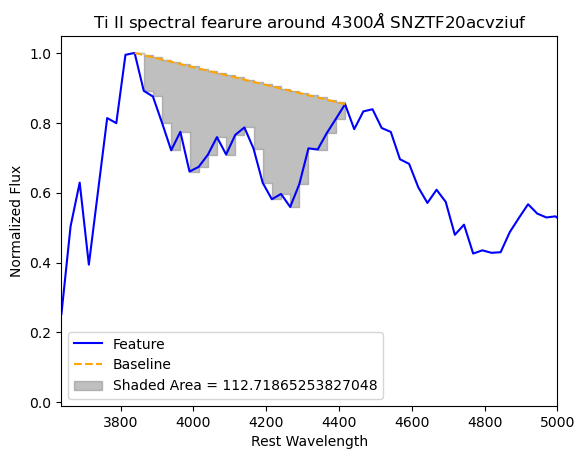

ZTF20acynjjo_20201222_SEDm_0_dereddened.csv


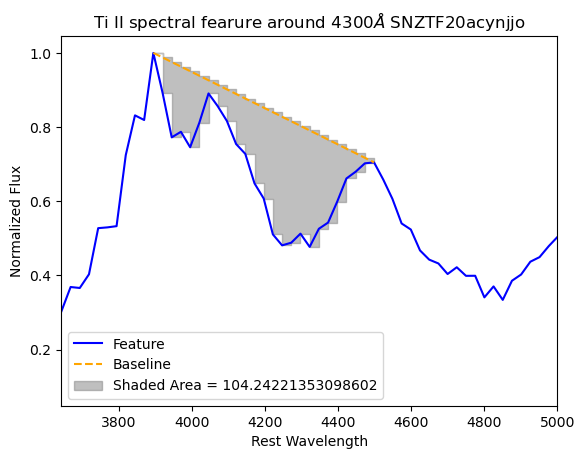

In [3]:
integral_list = []
df = pd.read_csv(r'C:\Users\senan\OneDrive\Desktop\Capstone\csv_files\dereddened_files_est_Ti_4300_new_clicks.csv')

filename = df['Dereddened File Name']
ztfname = df['ztfname']
z = df['z']
phase = df['Phase of spectrum']
wlx1 = df['wl_x1_Ti']
wlx2 = df['wl_x2_Ti']

ahh = 'hello\goodbye'  # just to get the slash in a string
slash = ahh[5] 
path_stem = r'C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra'

wavelength_min = 3900
wavelength_max = 4500

#wavelength_min = 3863.703677253942
#wavelength_max = 4472.433850153616

for i in range(len(filename)):
    print(filename[i])
    specfile = path_stem + slash + filename[i]
    data = pd.read_csv(specfile)
    wl_fit1=( np.array(data['wl']) ) / (1+z[i])
    fl_fit1=np.array(data['fl'])
    flerr_fit1=( np.array(data['fl']) ) * 0.01

#     # Normalize the feature flux (choose the method you prefer)
#     normalized_flux = normalize_flux(fl_fit1, method='peak')
    
    # Filter data within the specified range
    mask1r = np.where(wl_fit1 >= wlx1[i])
    mask1l =np.where(wl_fit1 <= wlx1[i])
    if np.abs(wl_fit1[mask1r][0] - wlx1[i]) < np.abs(wl_fit1[mask1l][-1] - wlx1[i]):
         side1 = 'right'
    elif np.abs(wl_fit1[mask1r][0] - wlx1[i]) > np.abs(wl_fit1[mask1l][-1] - wlx1[i]):
         side1 = 'left'

    mask2r = np.where(wl_fit1 >= wlx2[i])
    mask2l =np.where(wl_fit1 <= wlx2[i])
    if np.abs(wl_fit1[mask2r][0] - wlx2[i]) < np.abs(wl_fit1[mask2l][-1] - wlx2[i]):
         side2 = 'right'
    elif np.abs(wl_fit1[mask2r][0] - wlx2[i]) > np.abs(wl_fit1[mask2l][-1] - wlx2[i]):
         side2 = 'left'

    if side1 == 'right' and side2 == 'left':
        mask = (wl_fit1 >= wlx1[i]) & (wl_fit1 <= wlx2[i])
    
    elif side1 == 'right' and side2 == 'right':
         mask = (wl_fit1 >= wlx1[i]) & (wl_fit1 <= wl_fit1[mask2r][0])

    elif side1 == 'left' and side2 == 'left':
         mask = (wl_fit1 >= wl_fit1[mask1l][-1]) & (wl_fit1 <= wlx2[i])

    elif side1 =='left' and side2 == 'right':
         mask = (wl_fit1 >= wl_fit1[mask1l][-1]) & (wl_fit1 <= wl_fit1[mask2r][0])


    filtered_wavelength = wl_fit1[mask]
    #filtered_flux = normalized_flux[mask]  # Use normalized flux
    filtered_flux = fl_fit1[mask]
    normalized_flux = fl_fit1 / np.max(filtered_flux)
    normalized_filtered_flux = normalized_flux[mask]
    

    # Define the baseline as a linear line from the start to end of the filtered feature
    start_flux, end_flux = normalized_filtered_flux[0], normalized_filtered_flux[-1]
    baseline_flux = np.linspace(start_flux, end_flux, len(filtered_wavelength))

    # Calculate the area under the feature and baseline curves
    area_feature = integrate.simps(normalized_filtered_flux, filtered_wavelength)
    area_baseline = integrate.simps(baseline_flux, filtered_wavelength)

    # Calculate the shaded area (difference between the feature and baseline)
    shaded_area = area_baseline - area_feature
    integral_list.append(shaded_area)

    label = 'Shaded Area = ' + str(shaded_area)

    # Plot
    plt.plot(wl_fit1, normalized_flux, label='Feature', color='blue') 
    plt.plot(filtered_wavelength, baseline_flux, label='Baseline', color='orange', linestyle='--')
    plt.fill_between(filtered_wavelength, baseline_flux, normalized_filtered_flux, 
                    color='gray', alpha=0.5, label=label, step='post')
    plt.xlabel("Rest Wavelength")
    plt.ylabel("Normalized Flux")
    plt.title('Ti II spectral fearure around 4300$\AA$ SN' + ztfname[i])
    if min(wl_fit1) < 3000:
         plt.xlim(3000,5000)
    else:
         plt.xlim(min(wl_fit1),5000)
    plt.legend()
    plt.show()

iteration 0
ZTF18aabstmw_20180307_LCO-FLOYDS_0_dereddened.csv
0.02308648


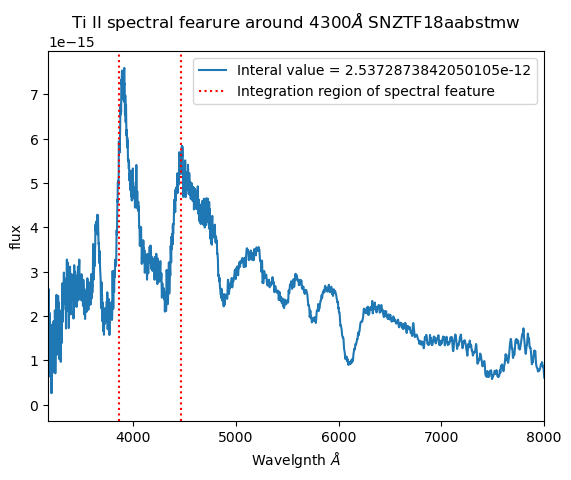

iteration 1
ZTF18aabstmw_20180307_SEDm_0_dereddened.csv
0.02308648


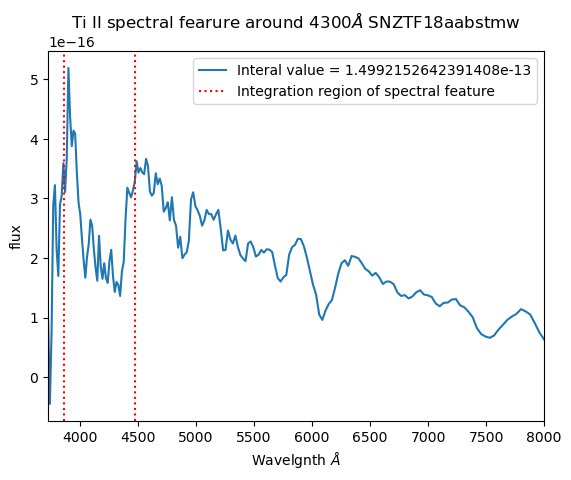

iteration 2
ZTF18aauizcr_20180519_SEDm_0_dereddened.csv
0.03391415


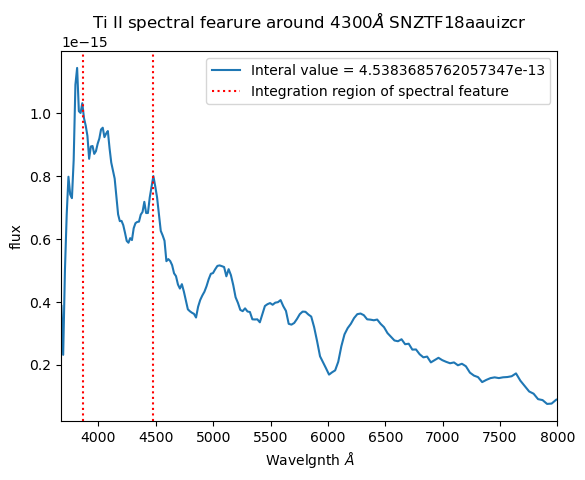

iteration 3
ZTF18aaxdrjn_20180531_SEDm_0_dereddened.csv
0.03388557


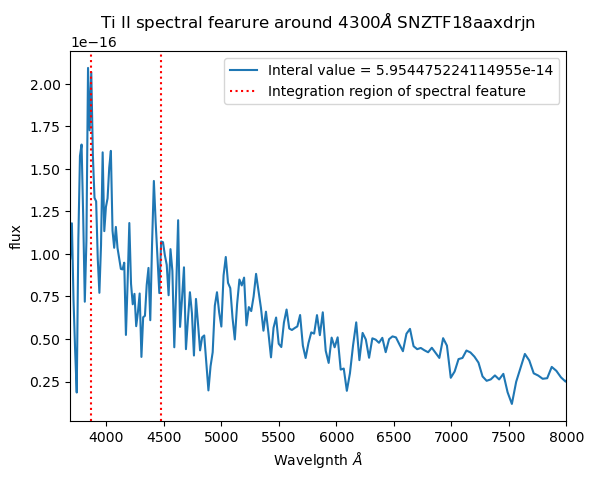

iteration 4
ZTF18aaxdrjn_20180603_LT_0_dereddened.csv
0.03388557


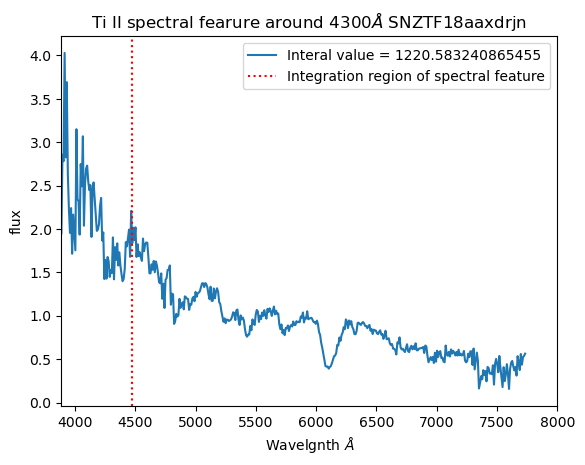

iteration 5
ZTF18absnqyo_20180908_SEDm_0_dereddened.csv
0.03861004


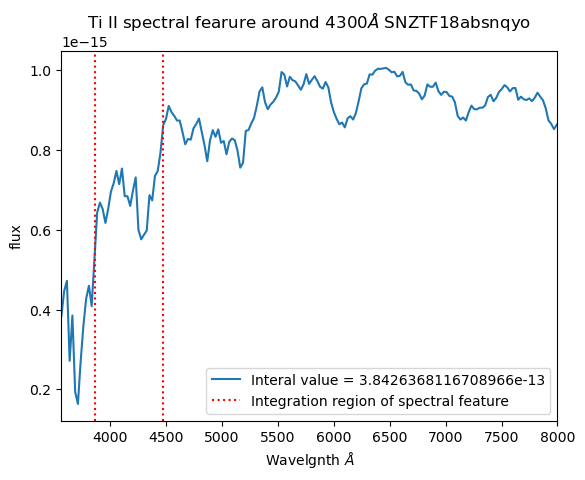

iteration 6
ZTF18abupgql_20180913_P200_0_dereddened.csv
0.0462104


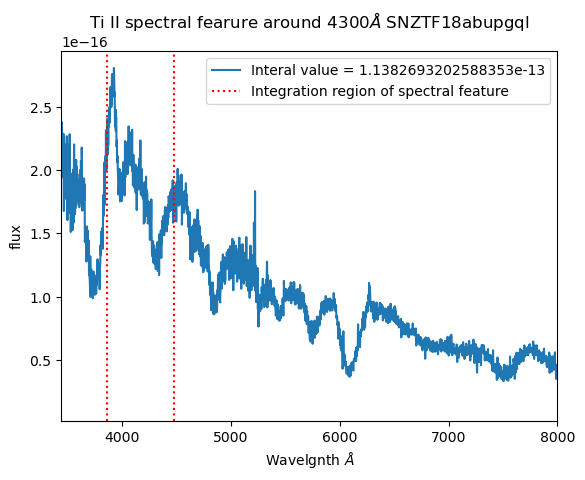

iteration 7
ZTF18abvejbm_20180914_SEDm_0_dereddened.csv
0.04416009


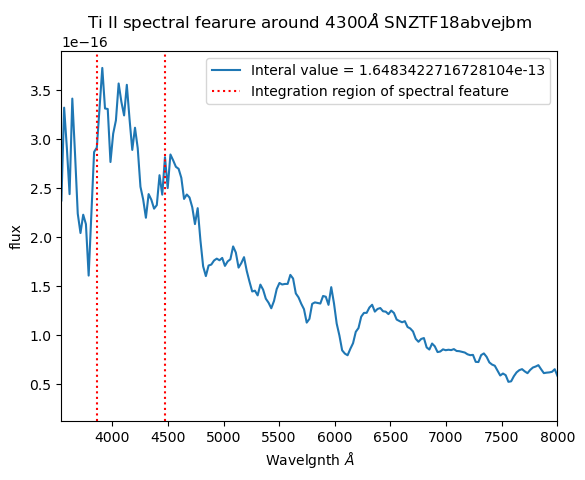

iteration 8
ZTF18acbvgqw_20181104_SEDm_0_dereddened.csv
0.00884722


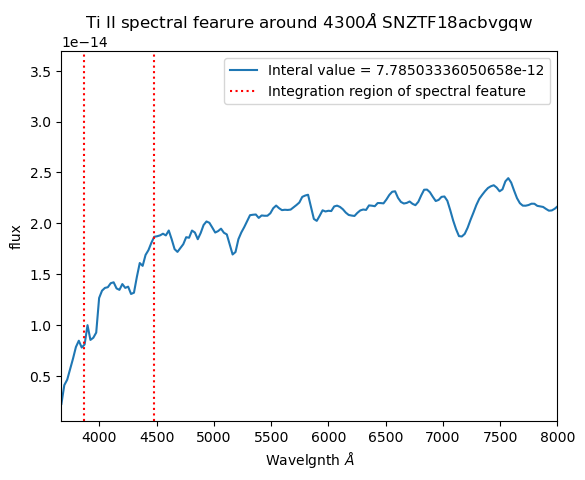

iteration 9
ZTF18acehilk_20181108_SEDm_0_dereddened.csv
0.03503777


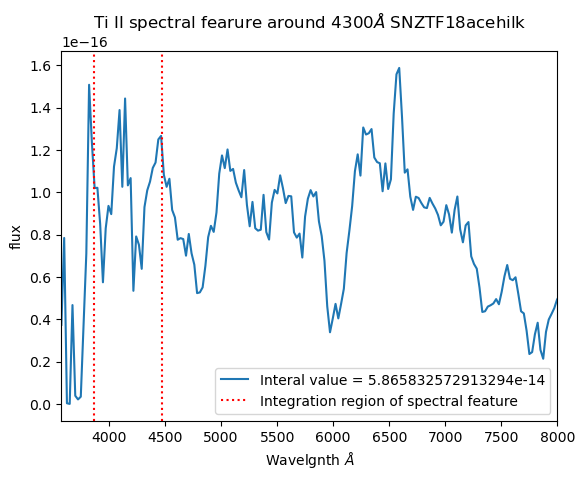

iteration 10
ZTF18achbllm_20181113_SEDm_0_dereddened.csv
0.04710716


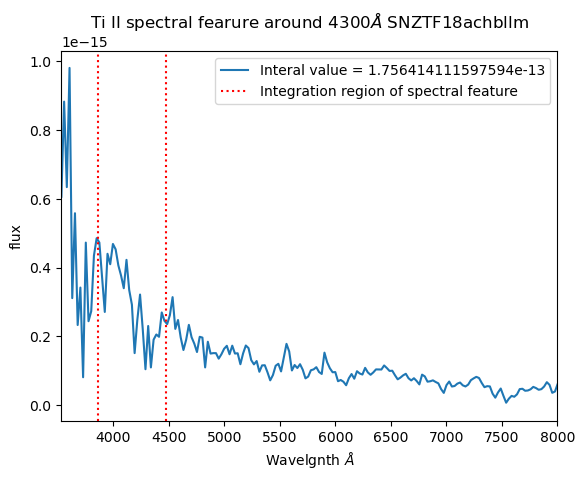

iteration 11
ZTF18achbllm_20181115_SEDm_0_dereddened.csv
0.04710716


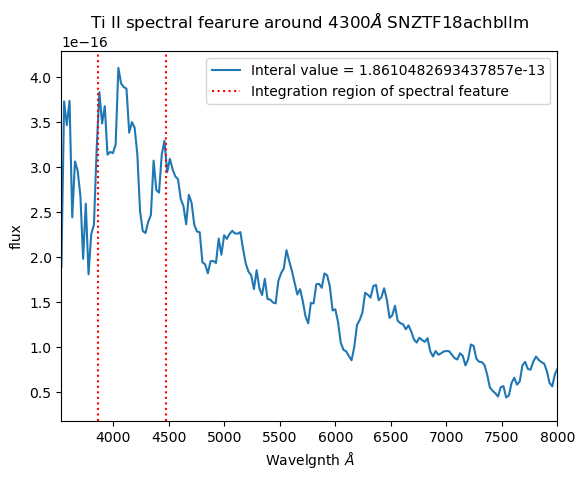

iteration 12
ZTF18acsyzca_20181206_LCO-FLOYDS_0_dereddened.csv
0.01424367


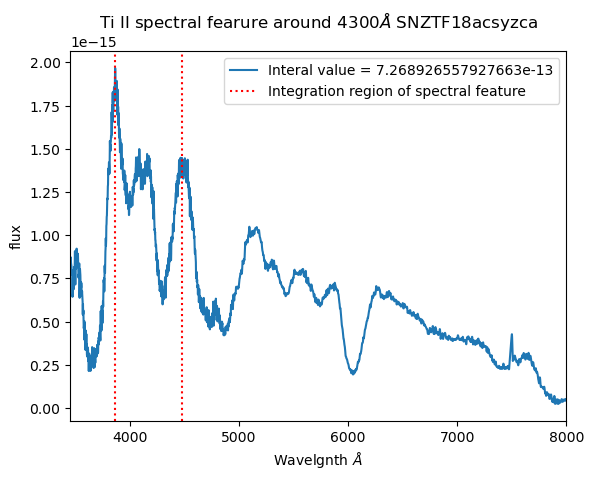

iteration 13
ZTF18acvrfvv_20181219_SEDm_0_dereddened.csv
0.04133705


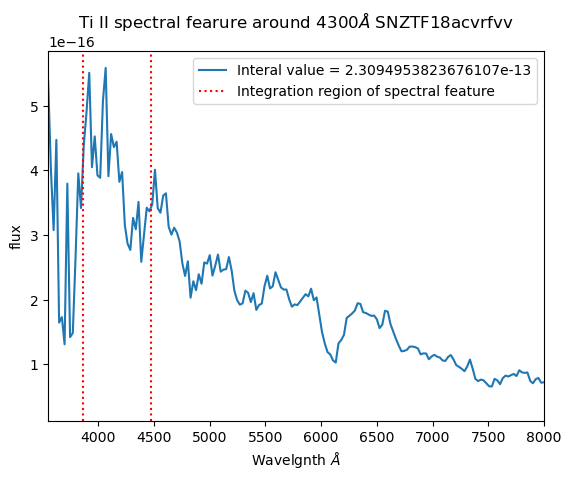

iteration 14
ZTF19aakizps_20190209_NTT_0_dereddened.csv
0.05514175


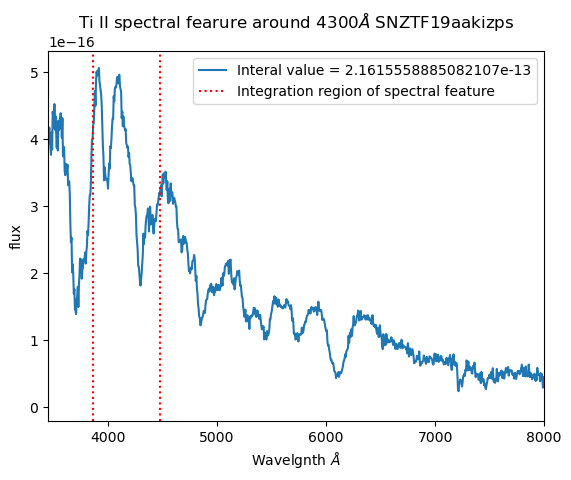

iteration 15
ZTF19aaklqod_20200214_SEDm_0_dereddened.csv
0.02995515


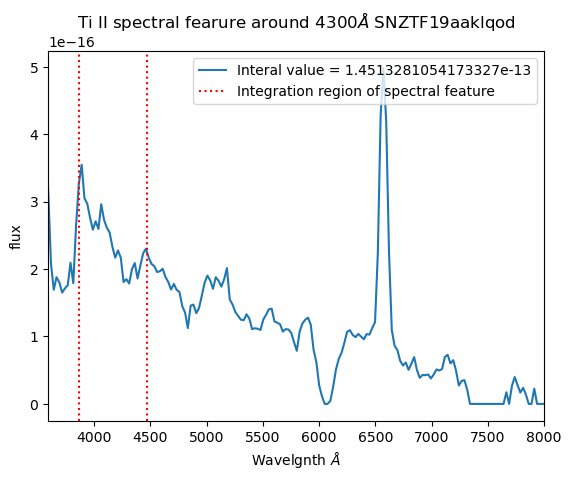

iteration 16
ZTF19aanhgqg_20190325_SEDm_0_dereddened.csv
0.02786203


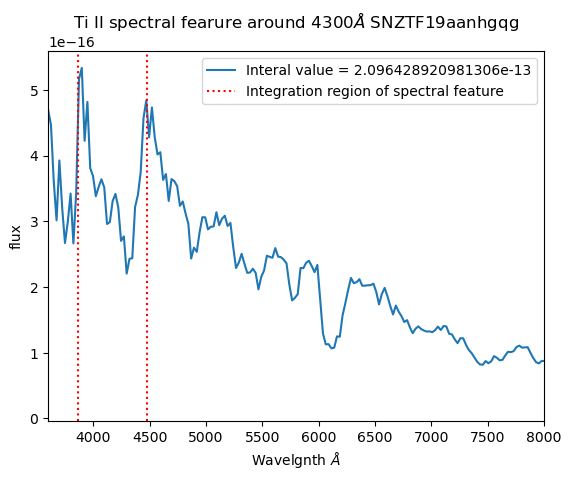

iteration 17
ZTF19aanhgqg_20190326_SEDm_0_dereddened.csv
0.02786203


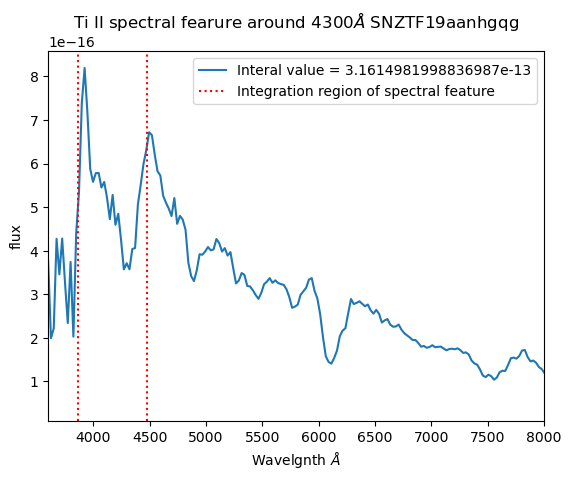

iteration 18
ZTF19aauhwbp_20190513_SEDm_0_dereddened.csv
0.03951246


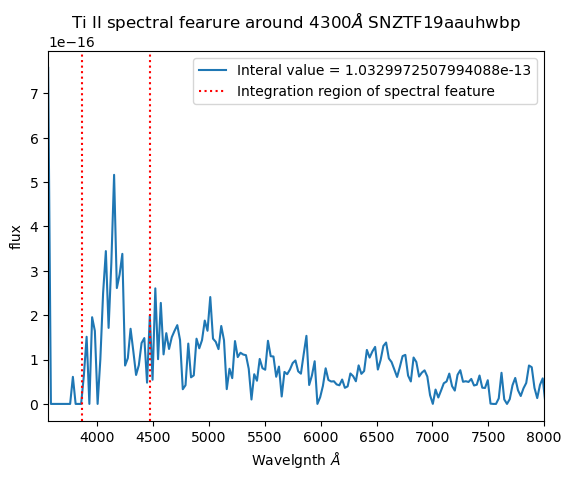

iteration 19
ZTF19aavrswr_20190603_SEDm_0_dereddened.csv
0.03276714


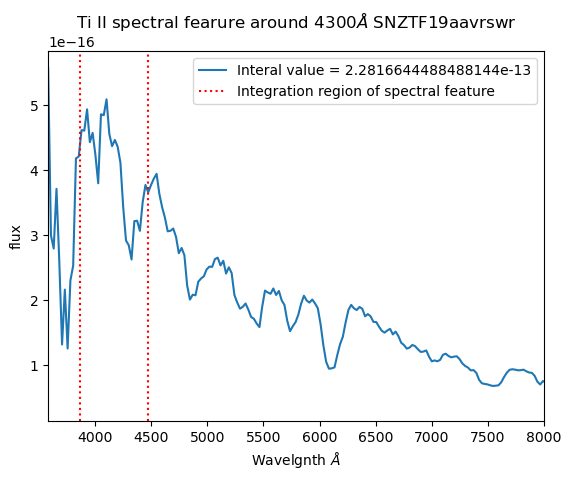

iteration 20
ZTF19abbytxa_20190629_SNIFS_0_dereddened.csv
0.05063173


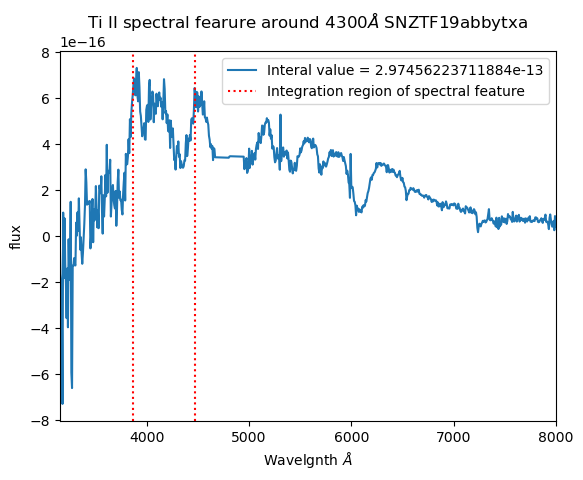

iteration 21
ZTF19abdrwsz_20190711_SEDm_0_dereddened.csv
0.02615929


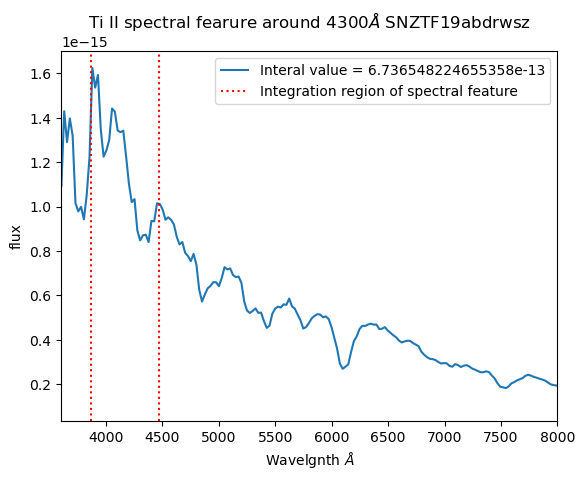

iteration 22
ZTF19abetjcx_20190708_SEDm_0_dereddened.csv
0.05713162


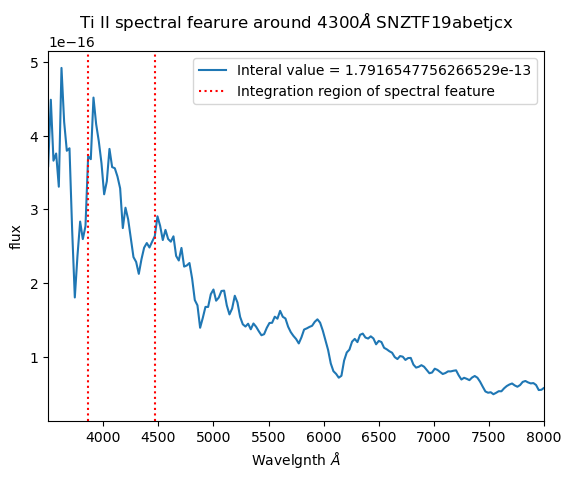

iteration 23
ZTF19abpbmli_20190816_SEDm_0_dereddened.csv
0.0370363


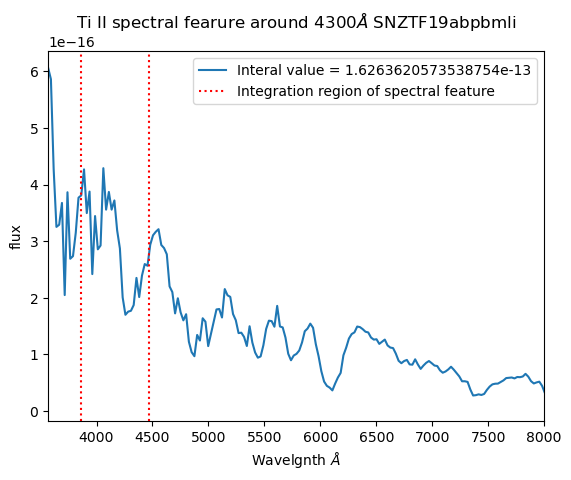

iteration 24
ZTF19abrogbl_20190828_SEDm_0_dereddened.csv
0.035788


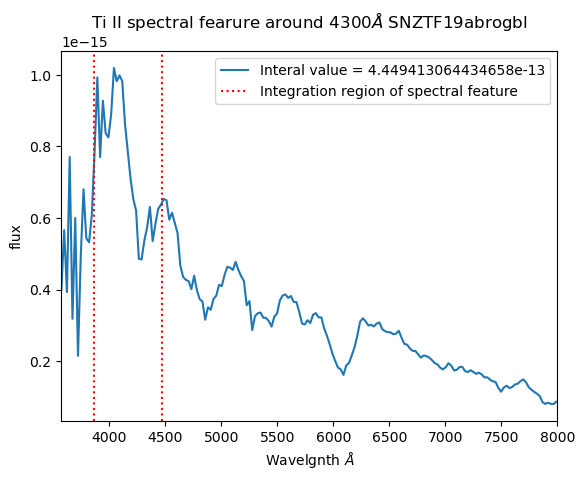

iteration 25
ZTF19abzlsbl_20190921_SEDm_0_dereddened.csv
0.03402776


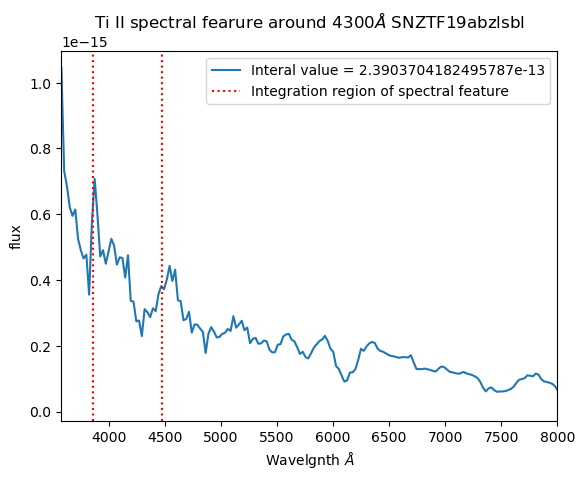

iteration 26
ZTF19aclofmz_20191105_SEDm_0_dereddened.csv
0.030792


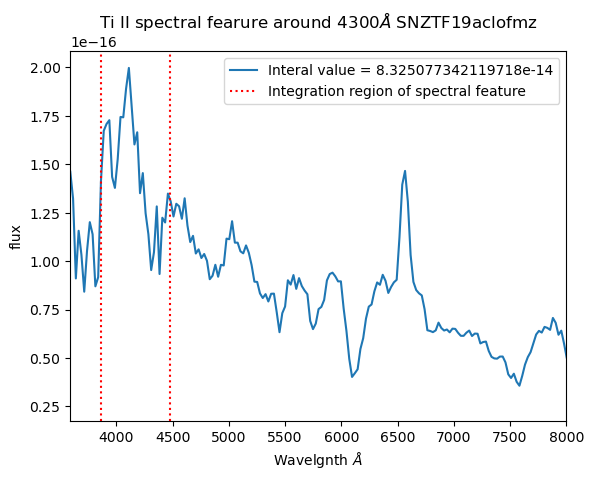

iteration 27
ZTF19acoxgqw_20191109_SEDm_0_dereddened.csv
0.0322677


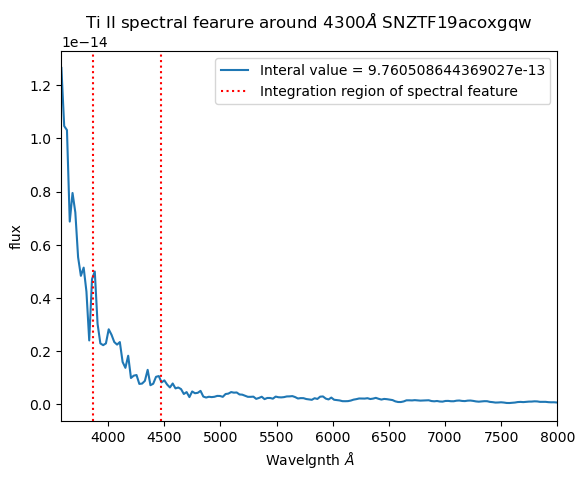

iteration 28
ZTF19acqehbt_20191112_SEDm_0_dereddened.csv
0.05522577


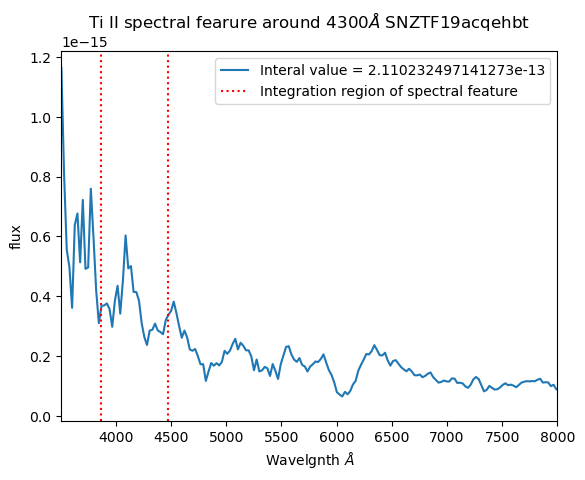

iteration 29
ZTF19acynije_20191220_LT_0_dereddened.csv
0.01908516


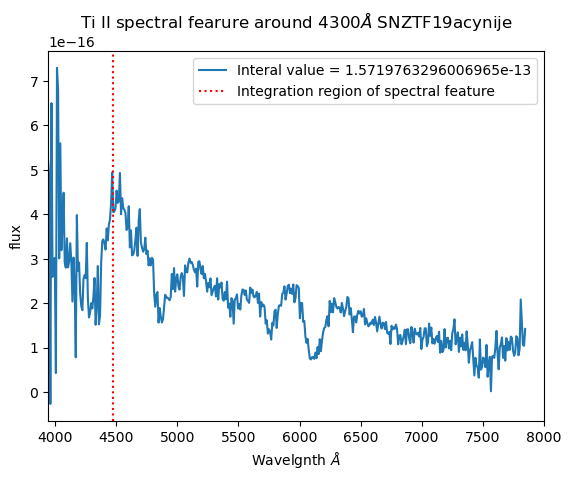

iteration 30
ZTF19adcdgca_20200102_SEDm_0_dereddened.csv
0.04677729


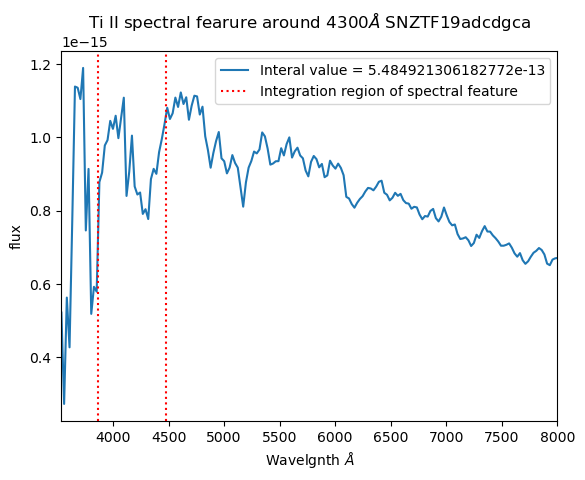

iteration 31
ZTF20aaaxacu_20200102_LT_0_dereddened.csv
0.02208516


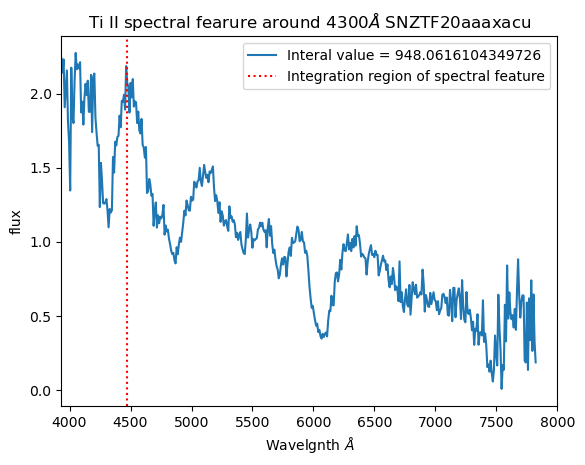

iteration 32
ZTF20aacevxq_20200107_SEDm_0_dereddened.csv
0.02082774


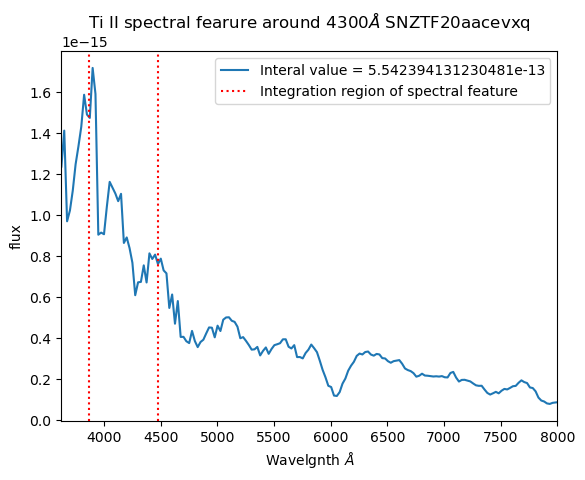

iteration 33
ZTF20aahqbib_20200128_SEDm_0_dereddened.csv
0.05558274


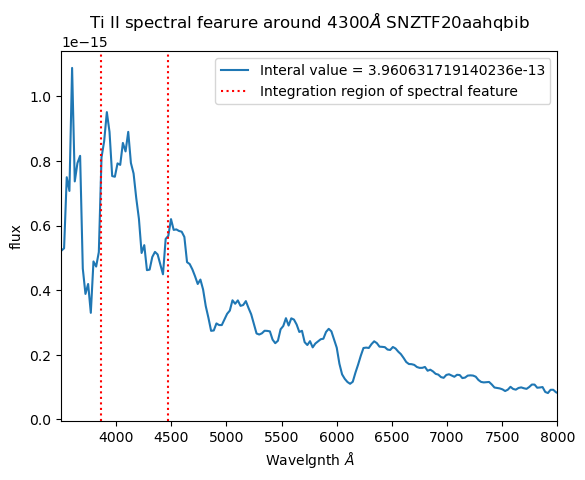

iteration 34
ZTF20aamkyyx_20200214_SEDm_0_dereddened.csv
0.04968179


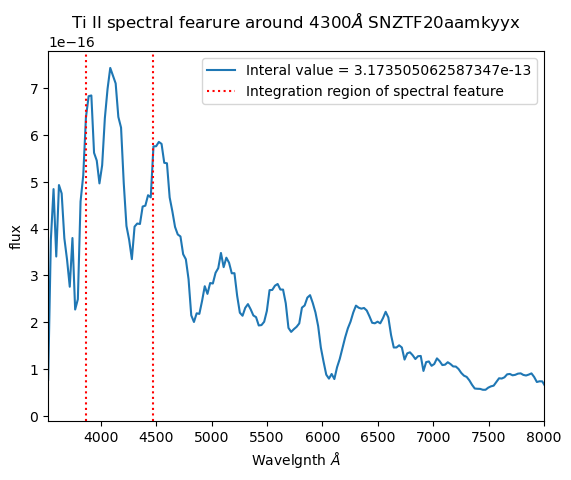

iteration 35
ZTF20aammhli_20200213_Lick-3m_0_dereddened.csv
0.02427873


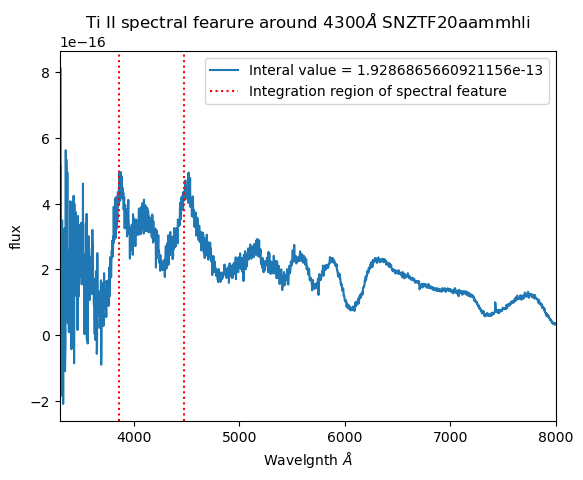

iteration 36
ZTF20aaodkvl_20200217_SEDm_0_dereddened.csv
0.0251175


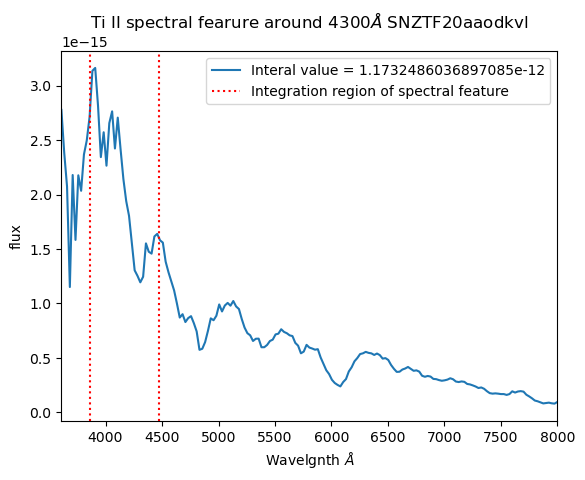

iteration 37
ZTF20aapcmur_20200225_SEDm_0_dereddened.csv
0.04221969


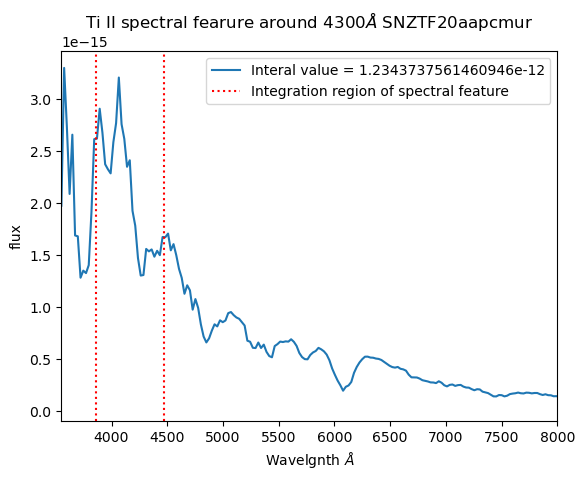

iteration 38
ZTF20aatvzmm_20200331_SEDm_0_dereddened.csv
0.03151248


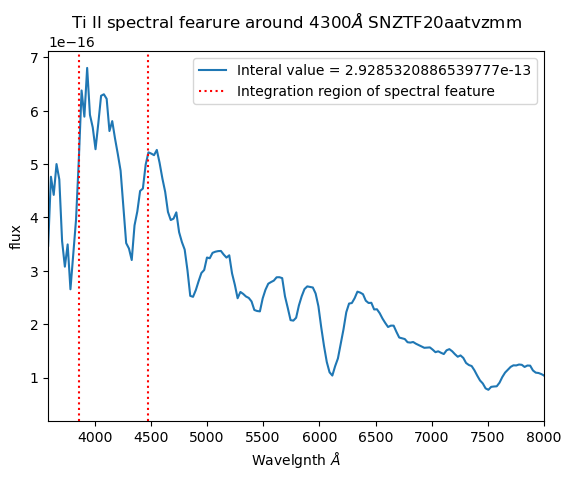

iteration 39
ZTF20aaumsrr_20200409_Other_0_dereddened.csv
0.00733461


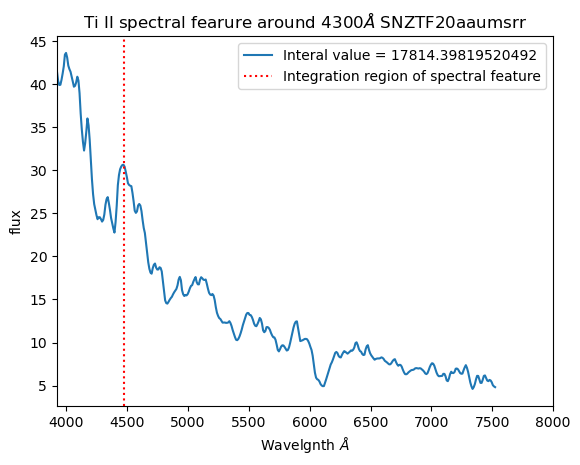

iteration 40
ZTF20aaurhzc_20200417_SEDm_0_dereddened.csv
0.03326635


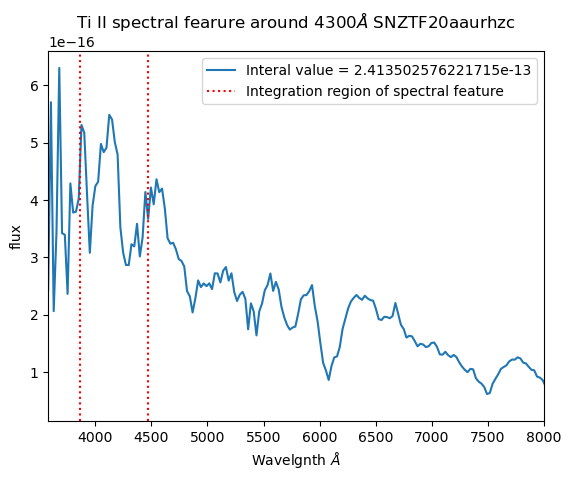

iteration 41
ZTF20aavnnat_20200424_SEDm_0_dereddened.csv
0.03219172


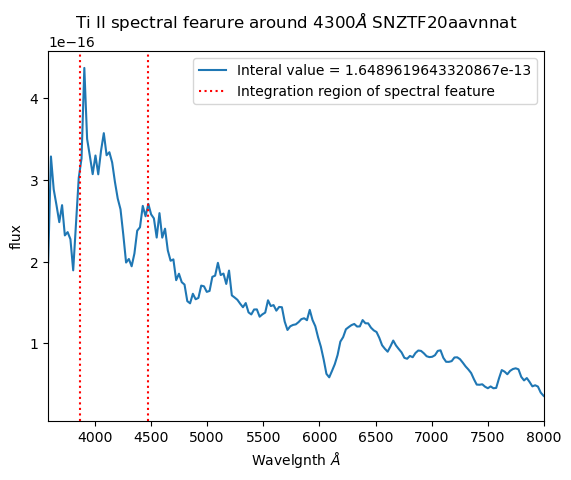

iteration 42
ZTF20aavrloz_20200425_SEDm_0_dereddened.csv
0.04337762


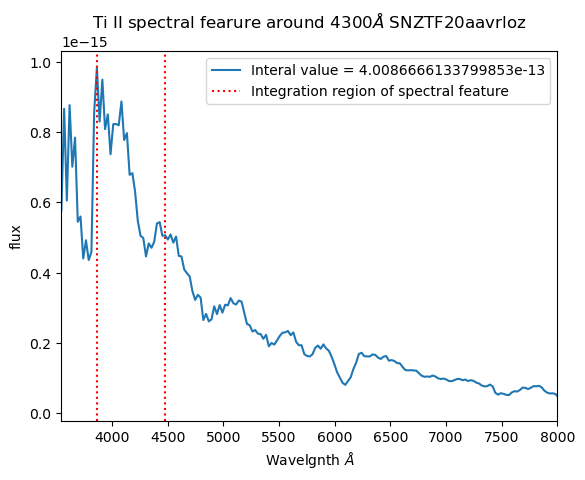

iteration 43
ZTF20aaymbjk_20200509_SEDm_0_dereddened.csv
0.02766247


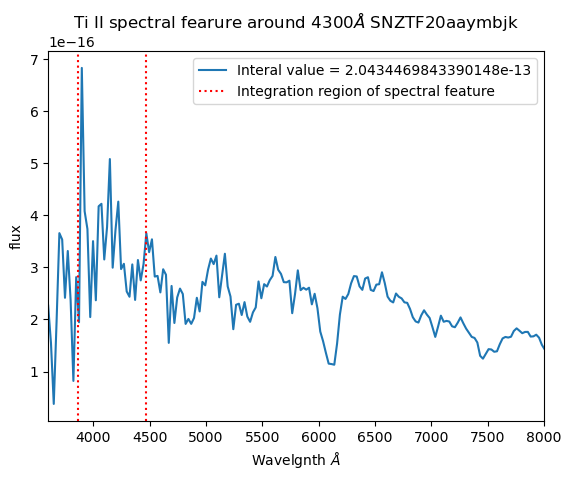

iteration 44
ZTF20aazgtmp_20200516_SEDm_0_dereddened.csv
0.02370821


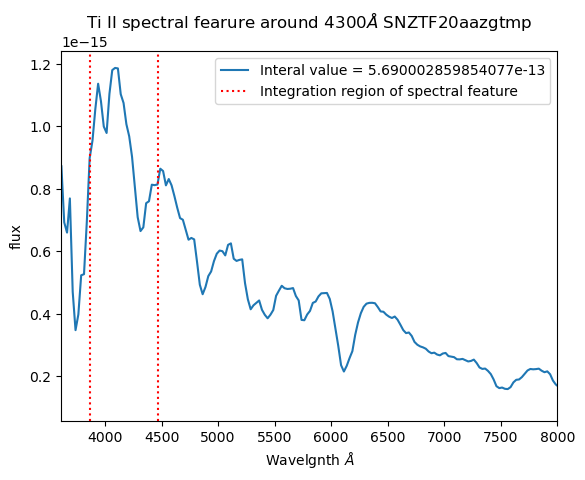

iteration 45
ZTF20aazhzna_20200516_SEDm_0_dereddened.csv
0.03656528


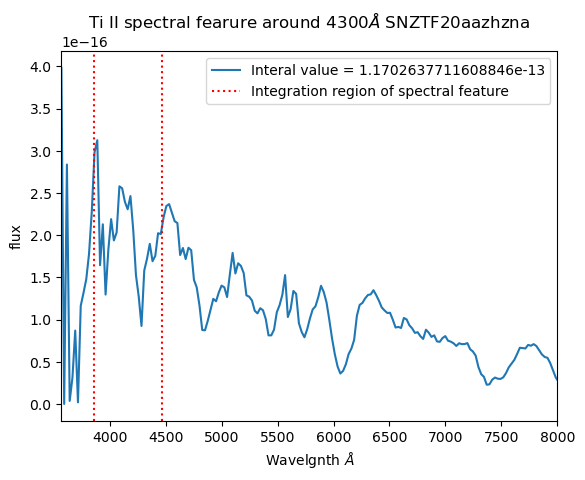

iteration 46
ZTF20aazkxcw_20200512_SEDm_1_dereddened.csv
0.03527774


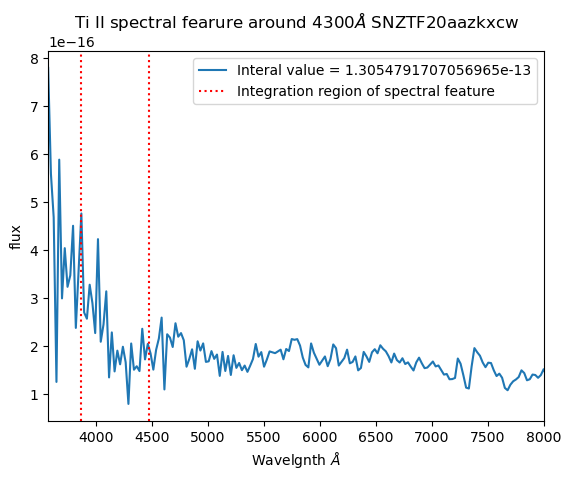

iteration 47
ZTF20abavxpk_20200525_SEDm_0_dereddened.csv
0.03018042


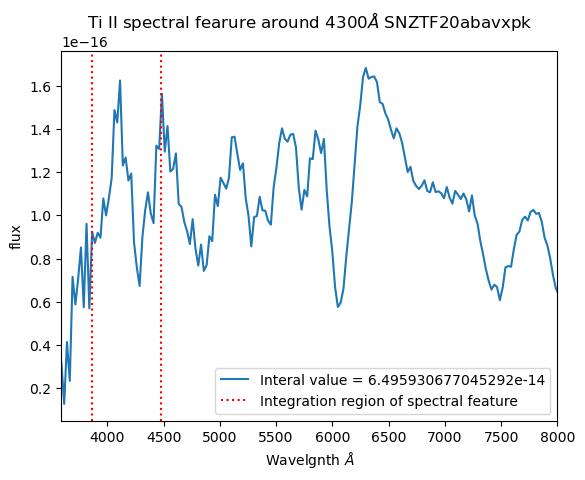

iteration 48
ZTF20abazekd_20200523_SEDm_0_dereddened.csv
0.05443432


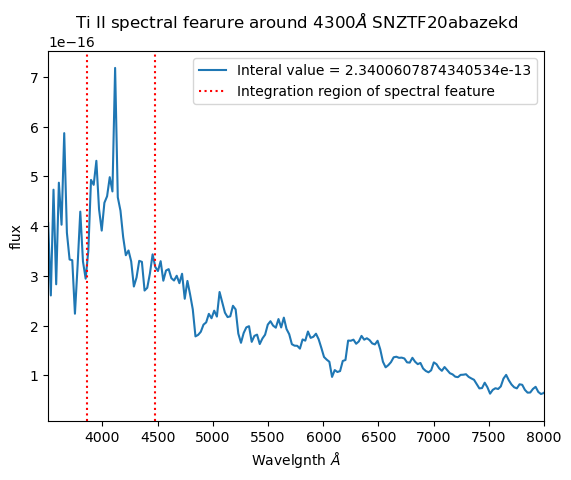

iteration 49
ZTF20abeeahl_20200609_SEDm_0_dereddened.csv
0.04888182


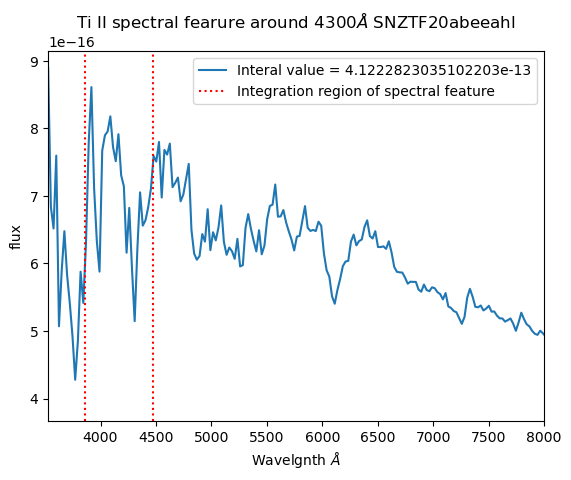

iteration 50
ZTF20abeeytg_20200613_SEDm_0_dereddened.csv
0.0427352


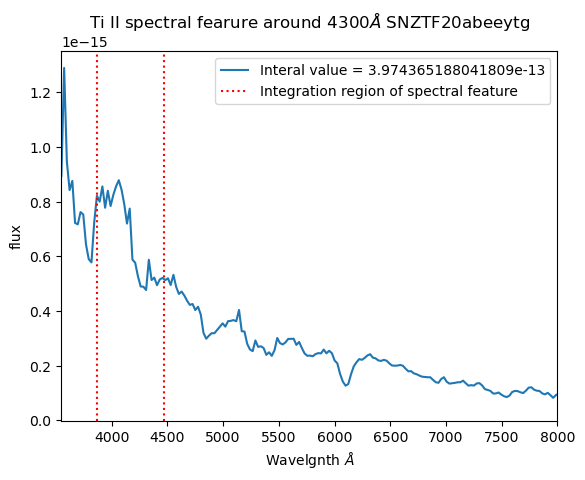

iteration 51
ZTF20abfhway_20200619_SEDm_0_dereddened.csv
0.04693154


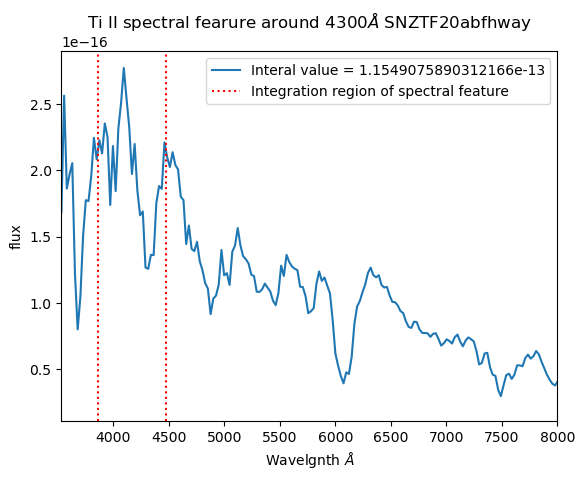

iteration 52
ZTF20abfsemq_20200622_SEDm_0_dereddened.csv
0.04745839


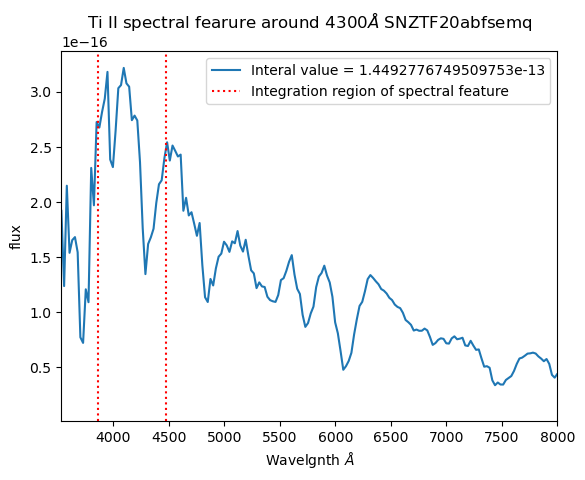

iteration 53
ZTF20abijfqq_20200625_LT_0_dereddened.csv
0.0028543


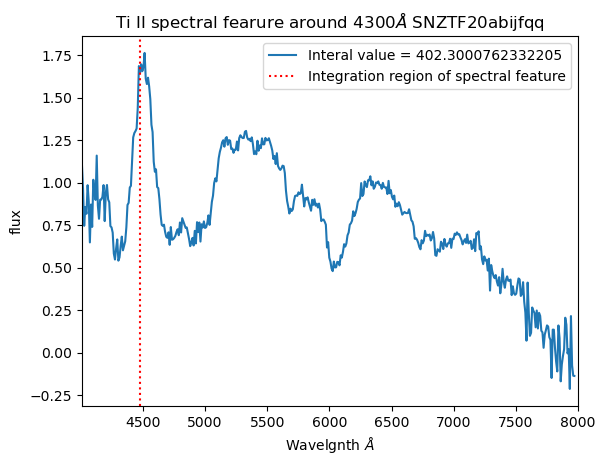

iteration 54
ZTF20ableiem_20200717_SEDm_0_dereddened.csv
0.01560413


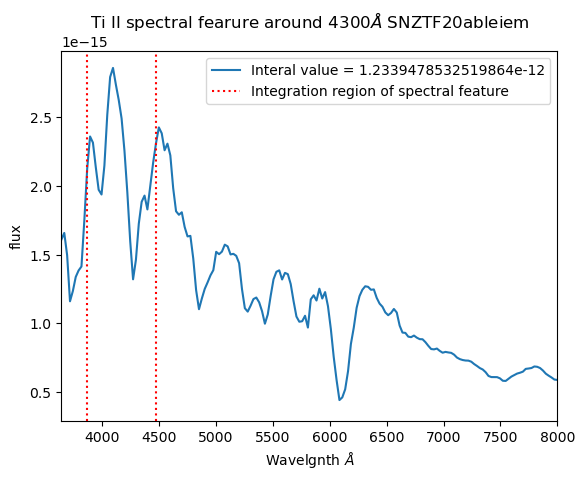

iteration 55
ZTF20abmoans_20200722_SEDm_0_dereddened.csv
0.03108456


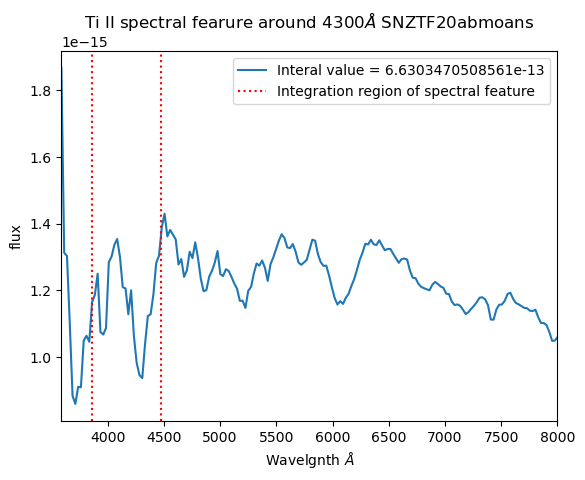

iteration 56
ZTF20abqbzuv_20200804_SEDm_0_dereddened.csv
0.02657839


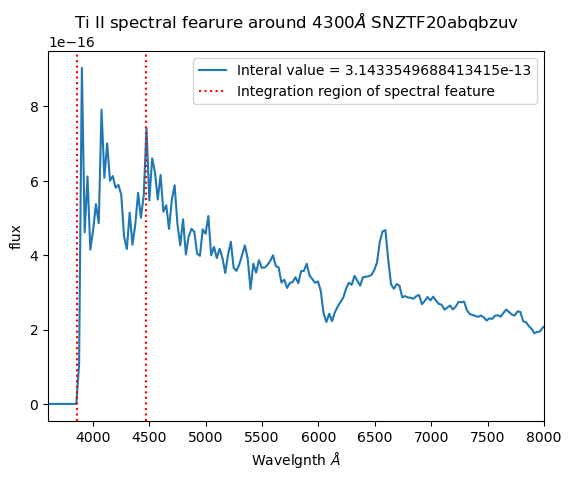

iteration 57
ZTF20abqmtsh_20200811_SEDm_0_dereddened.csv
0.02495727


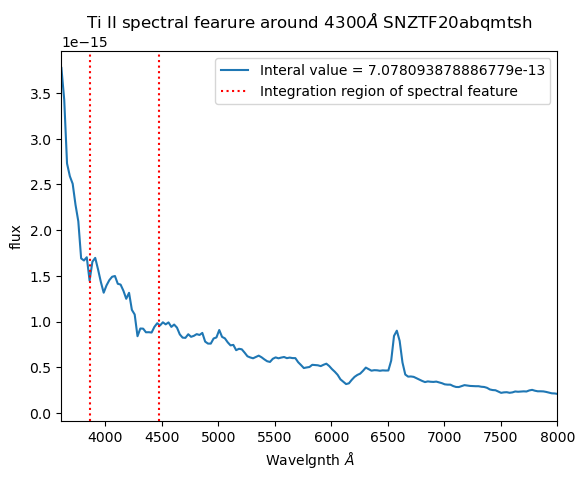

iteration 58
ZTF20abszyjg_20200821_SEDm_0_dereddened.csv
0.04492331


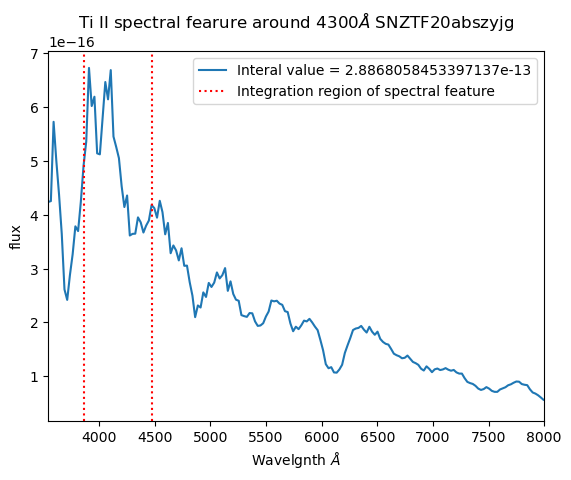

iteration 59
ZTF20abtctgr_20200817_GTC_0_dereddened.csv
0.03991305


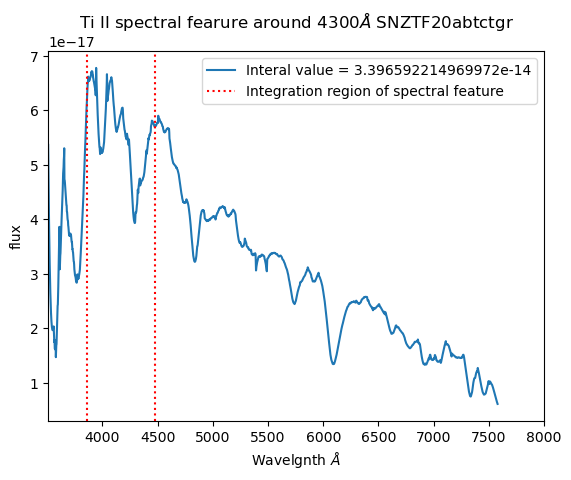

iteration 60
ZTF20abthxfr_20200820_SEDm_0_dereddened.csv
0.04005391


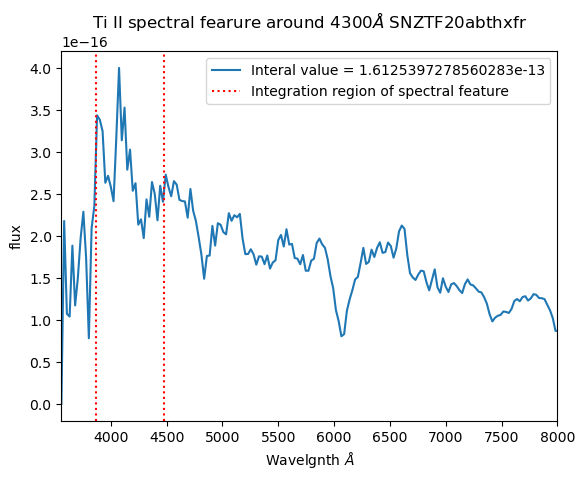

iteration 61
ZTF20acduffd_20200924_SEDm_0_dereddened.csv
0.01954352


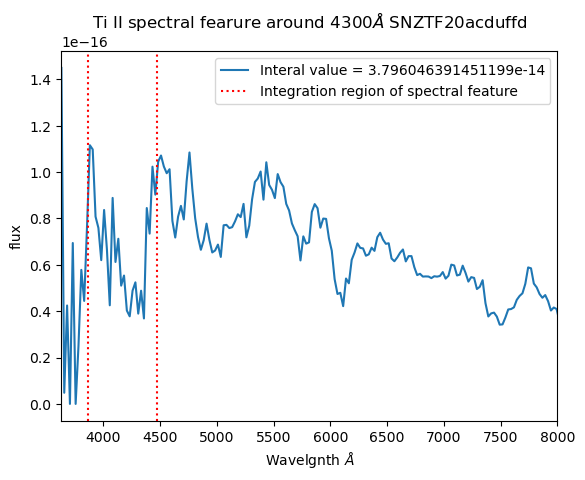

iteration 62
ZTF20acduffd_20200925_SEDm_0_dereddened.csv
0.01954352


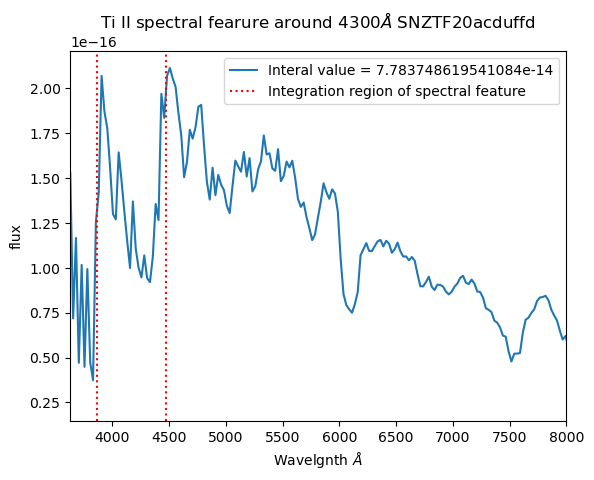

iteration 63
ZTF20acduffd_20200927_SEDm_0_dereddened.csv
0.01954352


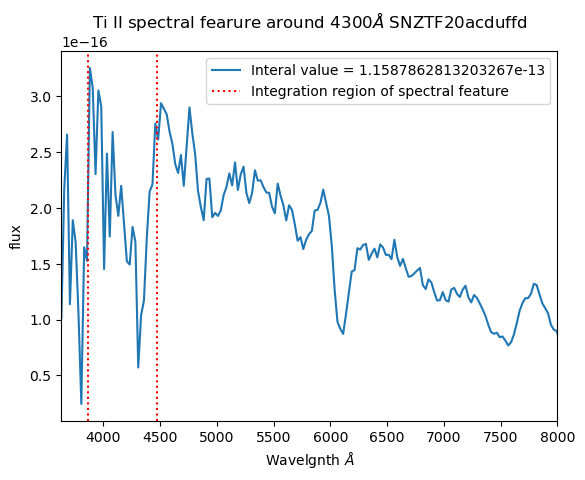

iteration 64
ZTF20acojxtb_20201105_NTT_0_dereddened.csv
0.05588531


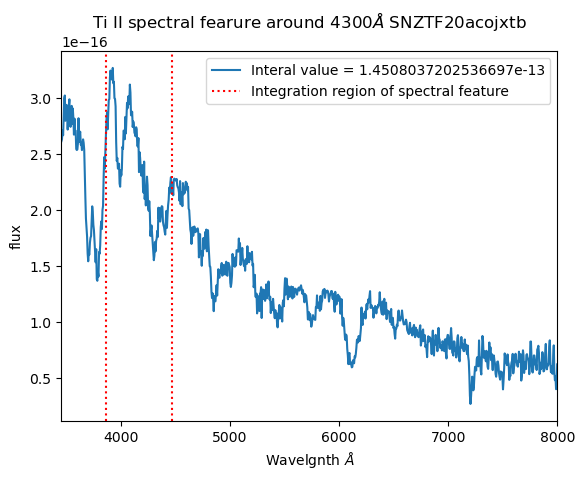

iteration 65
ZTF20acoyyly_20201110_SEDm_0_dereddened.csv
0.0475529


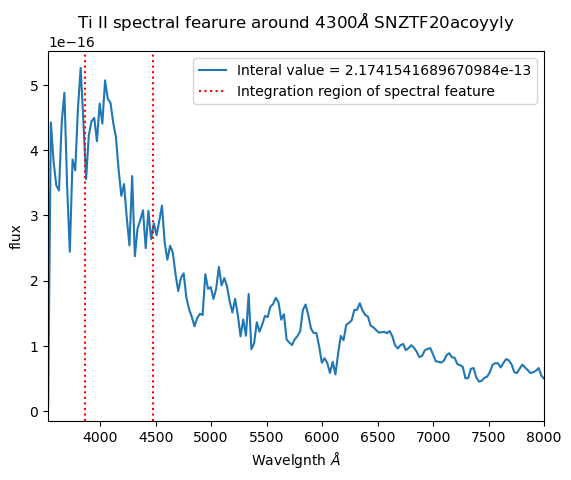

iteration 66
ZTF20acuosvy_20201202_SEDm_0_dereddened.csv
0.00790221


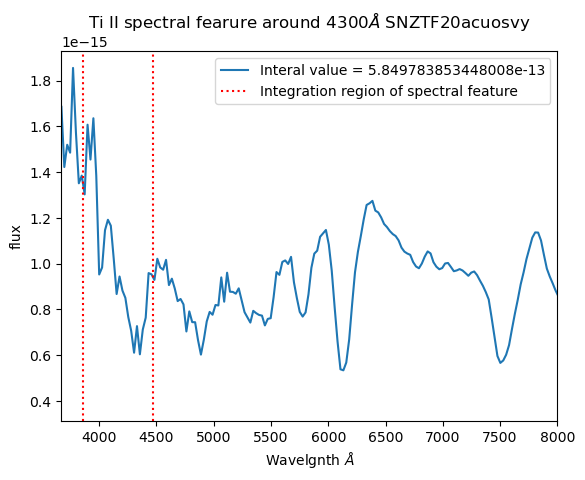

iteration 67
ZTF20acvziuf_20201210_CMO-2.5m_0_dereddened.csv
0.01721191


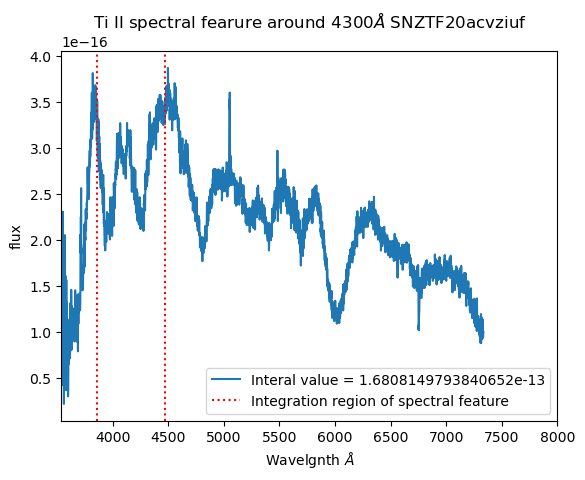

iteration 68
ZTF20acvziuf_20201210_SEDm_0_dereddened.csv
0.01721191


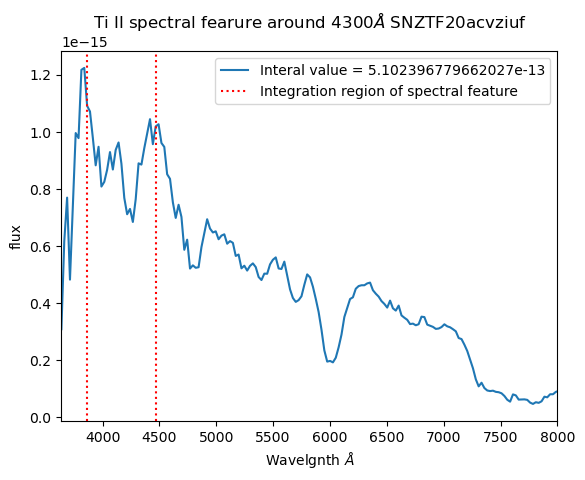

iteration 69
ZTF20acynjjo_20201222_SEDm_0_dereddened.csv
0.01587344


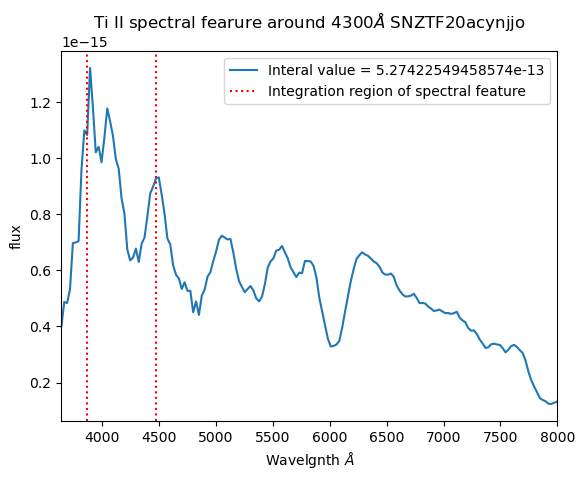

5.27422549458574e-13


In [ ]:
# #my own attempt at some shite

# integral_list = []

# df = pd.read_csv(r"C:\Users\senan\OneDrive\Desktop\Capstone\csv_files\dereddened_files_est_Ti_normalisation_wl.csv")


# filename = df['Dereddened File Name']
# ztfname = df['ztfname']
# z = df['z']
# phase = df['Phase of spectrum']

# wlx1_df= df['wl_x1_Ti']
# wlx2_df = df['wl_x2_Ti']

# #%%
# st = time.time()

# ahh = 'hello\goodbye'  # just to get the slash in a string
# slash = ahh[5] 
# path_stem = r'C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra'

# for i in range(len(filename)):
#     iteration = i
#     print("iteration", iteration)

#     spec_file = path_stem + slash + filename[i]

#     data = pd.read_csv(spec_file)
#     wl_fit1=( np.array(data['wl']) ) / (1+z[i])
#     fl_fit1=np.array(data['fl'])
#     flerr_fit1=( np.array(data['fl']) ) * 0.01
    
#     print(filename[i])
#     print(z[i])

#     wlx1 = df['wl_x1_Ti'][i]
    
#     wlx2 = df['wl_x2_Ti'][i]

#     feature_band = np.where( np.logical_and(wl_fit1 >= 3863.703677253942, wl_fit1 <= 4472.433850153616)) #feature boundaries taken from ZTF18acsyzca
#     wl_featband = wl_fit1[feature_band]
#     fl_featband = fl_fit1[feature_band]
#     fl_scaled = fl_fit1 / max(fl_featband)
#     fl_featband_scaled = fl_scaled[feature_band]


#     #normalise_band = np.where( np.logical_and(wl_fit1 >= wlx1, wl_fit1 <= wlx2))
#     #wl_normband = wl_fit1[normalise_band]
#     #fl_normband = fl_fit1[normalise_band]
#     #mean_fl_in_normband = np.mean(fl_normband)

#     #fl_scaled = fl_fit1/mean_fl_in_normband
#     #fl_scaled = fl_fit1/np.mean(fl_featband)
#     #fl_scaled_featband = fl_scaled[feature_band]

#     normalise_band  = np.where( np.logical_and(wl_fit1>=7000, wl_fit1<=7200))
#     #median_flux = np.median(fl_fit1[normalise_band])
#     #mad_flux = np.median(np.abs(fl_fit1[normalise_band] - median_flux))
#     #if mad_flux != 0:
#     #    normalized_flux = fl_fit1 / mad_flux
#     #else:
#     #    normalized_flux = np.nan * fl_fit1
#     #normalized_flux_featband = normalized_flux[feature_band]
#     #fl_scaled = fl_fit1/np.mean(fl_fit1[normalise_band])
#     #fl_scaled_featband = fl_scaled[feature_band]
    

#     integral = integrate.trapezoid(fl_featband,wl_featband)
#     integral_list.append(integral)
    
#     lable='Interal value = '+ str(integral)
#     plt.figure(i)
#     plt.plot(wl_fit1,fl_fit1, label=lable)
#     plt.title('Ti II spectral fearure around 4300$\AA$ SN' + ztfname[i])
#     plt.xlabel('Wavelgnth $\AA$')
#     plt.ylabel('flux')
#     plt.axvline(x=3863.703677253942, color='r', linestyle=':', label='Integration region of spectral feature')
#     plt.axvline(x=4472.433850153616, color='r', linestyle=':')
#     if min(wl_fit1) < 3000:
#         plt.xlim(3000,8000)
#     else:
#         plt.xlim(min(wl_fit1),8000)
#     plt.legend()
#     #plt.savefig(spec_file + '_Ti_new.png')
#     plt.show()


# print(integral)

In [4]:
df.insert(7,'integral', integral_list)
#df = df.drop(df.columns[1], axis=1)
#df.to_csv('TiII_integral_values.csv')
df.to_csv(r'C:\Users\senan\OneDrive\Desktop\Capstone\csv_files' + slash + 'TiII_integral_values_new_clicks.csv')

from here I arrange and plot the spectra not considering any SNR cuts

In [1]:
#data is imported on and sorted by phase

Umut_csv = pd.read_csv(r"C:\Users\senan\OneDrive\Desktop\Capstone\ztf_umt_subtype_5972.csv")
Umut_subtype = np.array(Umut_csv['New_Type'])
Umut_name = np.array(Umut_csv['ztfname'])


info_csv = pd.read_csv(r"C:\Users\senan\OneDrive\Desktop\Capstone\Final_table_allinfo_allcuts.csv")
info_csv.sort_values(by='Phase of spectrum', inplace=True)
info_name = np.array(info_csv['ztfname'])
info_subtype = np.array(info_csv['SN Sub Type'])
info_file = np.array(info_csv['Dereddened File Name'])
info_phase = np.array(info_csv['Phase of spectrum'])
info_redshift = np.array(info_csv['z'])

phase_min = -20
phase_max = -5

norm = plt.Normalize(vmin=phase_min, vmax=phase_max)  # Set min and max for normalization
colors = cm.inferno(norm(info_phase))  # Map time values to colors

new_subtype = []
for i in range(len(info_subtype)):
    for j in range(len(Umut_subtype)):
        if info_name[i] == Umut_name[j]:
            new_subtype.append(Umut_subtype[j])
            #print(info_name[i],info_subtype[i], "       ", Umut_name[j],Umut_subtype[j])
            #print("")
    new_subtype.append(info_subtype[i])
print(len(new_subtype),len(info_subtype))

NameError: name 'pd' is not defined

In [5]:
#arranging all the data by SN subtype

name_normal = []
phase_normal = []
file_normal = []
subtype_normal = []
redshift_normal = []
colors_normal = []

name_91bg = []
phase_91bg = []
file_91bg = []
subtype_91bg = []
redshift_91bg = []
colors_91bg = []

name_91T = []
phase_91T = []
file_91T = []
subtype_91T = []
redshift_91T = []
colors_91T = []

name_04gs = []
phase_04gs = []
file_04gs = []
subtype_04gs = []
redshift_04gs = []
colors_04gs = []

name_86G = []
phase_86G = []
file_86G = []
subtype_86G = []
redshift_86G = []
colors_86G = []

name_iax = []
phase_iax = []
file_iax = []
subtype_iax = []
redshift_iax = []
colors_iax = []

for i in range(len(info_name)):
    if str(info_subtype[i])[0:4] == 'norm':
        name_normal.append(info_name[i])
        phase_normal.append(info_phase[i])
        file_normal.append(info_file[i])
        subtype_normal.append(info_subtype[i])
        redshift_normal.append(info_redshift[i])
        colors_normal.append(colors[i])

    if str(info_subtype[i])[0:4] == '91bg':
        name_91bg.append(info_name[i])
        phase_91bg.append(info_phase[i])
        file_91bg.append(info_file[i])
        subtype_91bg.append(info_subtype[i])
        redshift_91bg.append(info_redshift[i])
        colors_91bg.append(colors[i])

    if str(info_subtype[i]) == '91t':
        name_91T.append(info_name[i])
        phase_91T.append(info_phase[i])
        file_91T.append(info_file[i])
        subtype_91T.append(info_subtype[i])
        redshift_91T.append(info_redshift[i])
        colors_91T.append(colors[i])

    if str(info_subtype[i]) == 'norm/04gs':
        name_04gs.append(info_name[i])
        phase_04gs.append(info_phase[i])
        file_04gs.append(info_file[i])
        subtype_04gs.append(info_subtype[i])
        redshift_04gs.append(info_redshift[i])
        colors_04gs.append(colors[i])

    if str(info_subtype[i]) == '91bg/86G':
        name_86G.append(info_name[i])
        phase_86G.append(info_phase[i])
        file_86G.append(info_file[i])
        subtype_86G.append(info_subtype[i])
        redshift_86G.append(info_redshift[i])
        colors_86G.append(colors[i])

    if str(info_subtype[i]) == 'iax':
        name_iax.append(info_name[i])
        phase_iax.append(info_phase[i])
        file_iax.append(info_file[i])
        subtype_iax.append(info_subtype[i])
        redshift_iax.append(info_redshift[i])
        colors_iax.append(colors[i])

name_91bg_1 = name_91bg[0:10]
phase_91bg_1 = phase_91bg[0:10]
file_91bg_1 = file_91bg[0:10]
subtype_91bg_1 = subtype_91bg[0:10]
redshift_91bg_1 = redshift_91bg[0:10]
colors_91bg_1 = colors_91bg[0:10]

name_91bg_2 = name_91bg[10:20]
phase_91bg_2 = phase_91bg[10:20]
file_91bg_2 = file_91bg[10:20]
subtype_91bg_2 = subtype_91bg[10:20]
redshift_91bg_2 = redshift_91bg[10:20]
colors_91bg_2 = colors_91bg[10:20]

name_normal_1 = name_normal[0:10]
phase_normal_1 = phase_normal[0:10]
file_normal_1 = file_normal[0:10]
subtype_normal_1 = subtype_normal[0:10]
redshift_normal_1 = redshift_normal[0:10]
colors_normal_1 = colors_normal[0:10]

name_normal_2 = name_normal[10:20]
phase_normal_2 = phase_normal[10:20]
file_normal_2 = file_normal[10:20]
subtype_normal_2 = subtype_normal[10:20]
redshift_normal_2 = redshift_normal[10:20]
colors_normal_2 = colors_normal[10:20]

name_normal_3 = name_normal[20:30]
phase_normal_3 = phase_normal[20:30]
file_normal_3 = file_normal[20:30]
subtype_normal_3 = subtype_normal[20:30]
redshift_normal_3 = redshift_normal[20:30]
colors_normal_3 = colors_normal[20:30]

name_normal_4 = name_normal[30:40]
phase_normal_4 = phase_normal[30:40]
file_normal_4 = file_normal[30:40]
subtype_normal_4 = subtype_normal[30:40]
redshift_normal_4 = redshift_normal[30:40]
colors_normal_4 = colors_normal[30:40]

name_normal_5 = name_normal[40:50]
phase_normal_5 = phase_normal[40:50]
file_normal_5 = file_normal[40:50]
subtype_normal_5 = subtype_normal[40:50]
redshift_normal_5 = redshift_normal[40:50]
colors_normal_5 = colors_normal[40:50]

name_normal_6 = name_normal[50:60]
phase_normal_6 = phase_normal[50:60]
file_normal_6 = file_normal[50:60]
subtype_normal_6 = subtype_normal[50:60]
redshift_normal_6 = redshift_normal[50:60]
colors_normal_6 = colors_normal[50:60]

name_normal_7 = name_normal[60:70]
phase_normal_7 = phase_normal[60:70]
file_normal_7 = file_normal[60:70]
subtype_normal_7 = subtype_normal[60:70]
redshift_normal_7 = redshift_normal[60:70]
colors_normal_7 = colors_normal[60:70]

name_normal_8 = name_normal[70:80]
phase_normal_8 = phase_normal[70:80]
file_normal_8 = file_normal[70:80]
subtype_normal_8 = subtype_normal[70:80]
redshift_normal_8 = redshift_normal[70:80]
colors_normal_8 = colors_normal[70:80]

name_normal_9 = name_normal[80:86]
phase_normal_9 = phase_normal[80:86]
file_normal_9 = file_normal[80:86]
subtype_normal_9 = subtype_normal[80:86]
redshift_normal_9 = redshift_normal[80:86]
colors_normal_9 = colors_normal[80:86]

#potential_rubbish = ['ZTF18aasprui', 'ZTF18abnzocn', 'ZTF20aammhli', 'ZTF20acuosvy','ZTF20acquetr', 'ZTF20abjapav', 'ZTF19aaafica', 'ZTF19aaklqod', 'ZTF20abaunmw', 'ZTF18abvejbm', 'ZTF18acbvgqw', 'ZTF18aazixbw', 'ZTF18aauizcr', 'ZTF19acoxgqw', 'ZTF20abucjsa', 'ZTF20abpsbyg', 'ZTF19abhxllw' ]
#print(len(potential_rubbish))

17


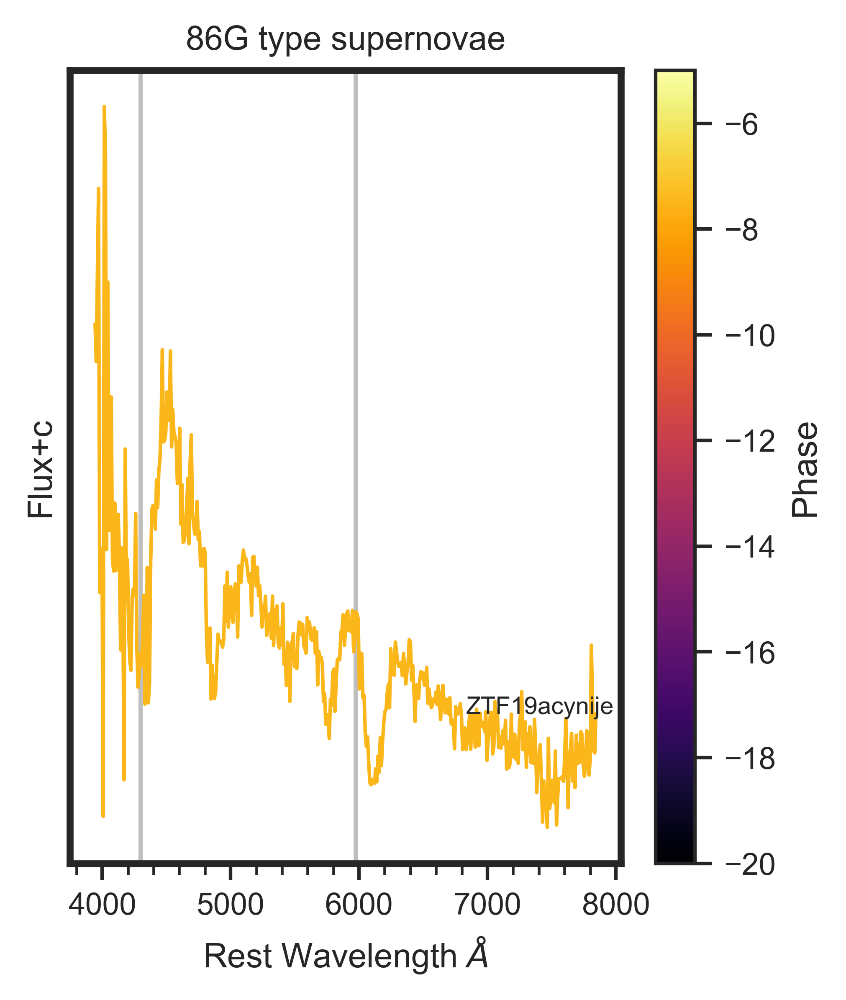

In [6]:
#86G
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)

fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_name = file_86G[0]
file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]
file_path = file_stem + slash + file_name
data = pd.read_csv(file_path)
wl = np.array(data['wl']) / (1+redshift_86G[0])
fl = np.array(data['fl'])
fl_mean = fl/np.mean(fl)

fl_nolow = []
wl_nolow = []

for i in range(len(fl_mean)):
    if fl_mean[i] >= 1e-2:
        fl_nolow.append(fl_mean[i])
        wl_nolow.append(wl[i])

fl_log = np.log10(fl_nolow)

sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_86G[0])
#sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax)
text = name_86G[0] #+ '\nphase = ' + str(phase_86G[0])[0:6]
ax.text(wl[int(0.74*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('86G type supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase', fontsize=10)
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'86Glike.png')

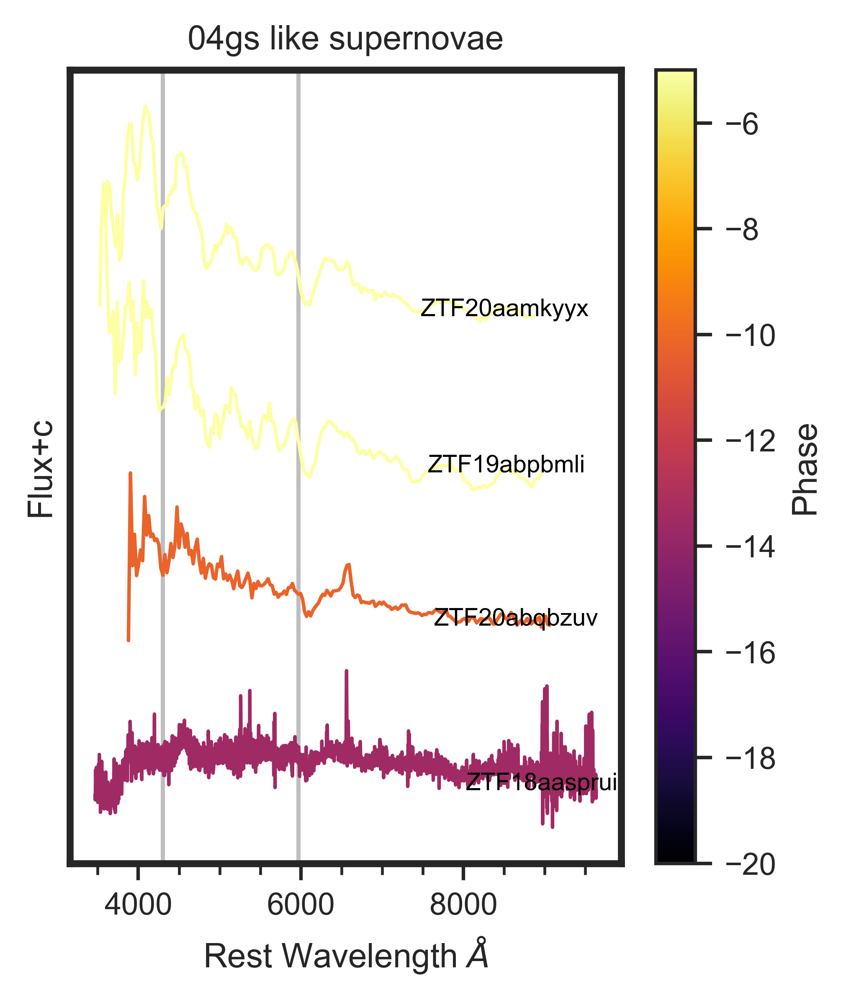

In [7]:
#04gs
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

a=0
for i in range(len(name_04gs)):
    file_path = file_stem + slash + file_04gs[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_04gs[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    #if a >=1:
    #    data_previous = pd.read_csv(file_stem + slash + file_04gs[a-1])
    #    #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #    fl_previous = np.array(data_previous['fl'])
    #    fl_previous_mean = fl_previous/np.mean(fl_previous)
    #    fl_previous_nolow = []
    #    #wl_previous_nolow = []
    #    for k in range(len(fl_previous_mean)):
    #        if fl_previous_mean[k] >= 1e-2:
    #            fl_previous_nolow.append(fl_previous_mean[k])
    #            #wl_previous_nolow.append(wl_previous[j])
    #    fl_previous_nolow = np.array(fl_previous_nolow)
    #    #wl_previous_nolow = np.array(wl_previous_nolow)
    #    for l in range(1000):
    #        if min(fl_nolow) <= max(fl_previous_nolow):
    #            fl_nolow = fl_nolow + 0.1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_04gs[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_04gs[i])#, label=lable)
    text = name_04gs[i] #+ '\nphase = ' + str(phase_04gs[i])[0:6]
    ax.text(wl[int(0.74*len(wl))],fl_nolow[-1], text, fontsize=7, color='k')
    a+=1
ax.set_title('04gs like supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'04gsLike.png')

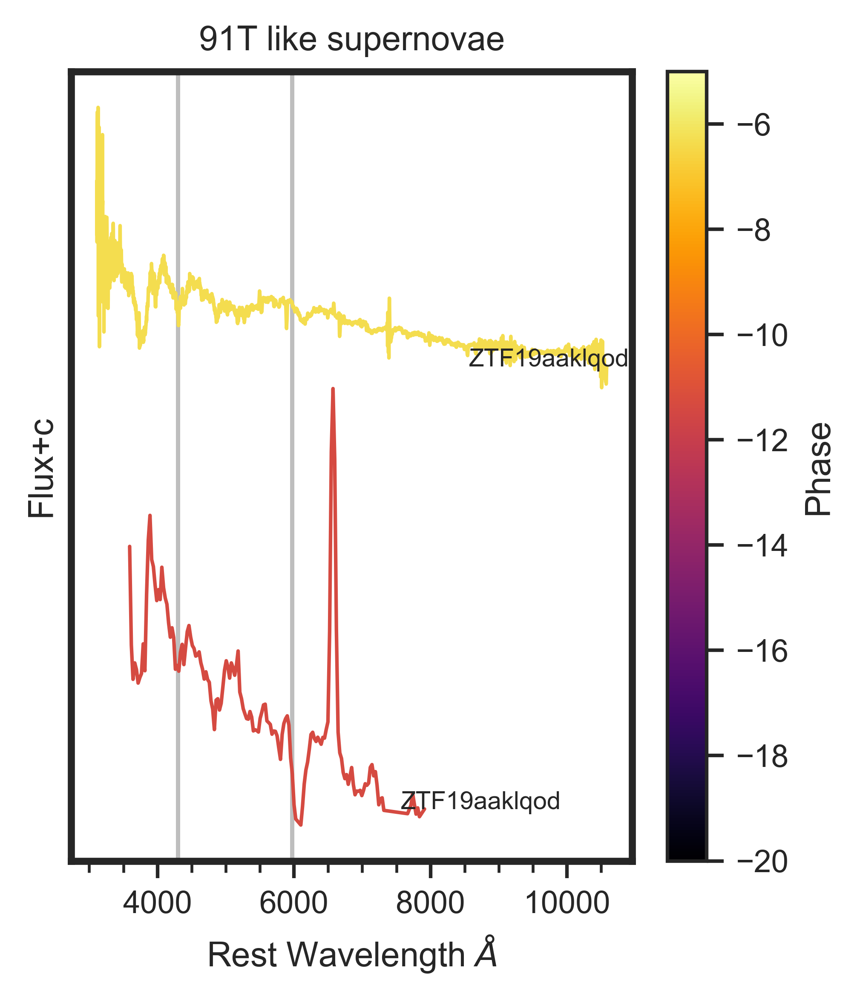

In [8]:
#91T
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.01), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_91T)):
    file_path = file_stem + slash + file_91T[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_91T[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    if i >=1:
        data_previous = pd.read_csv(file_stem + slash + file_91T[i-1])
        #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
        fl_previous = np.array(data_previous['fl'])
        fl_previous_mean = fl_previous/np.mean(fl_previous)
        fl_previous_nolow = []
        #wl_previous_nolow = []
        for j in range(len(fl_previous_mean)):
            if fl_previous_mean[j] >= 1e-2:
                fl_previous_nolow.append(fl_previous_mean[j])
                #wl_previous_nolow.append(wl_previous[j])
        fl_previous_nolow = np.array(fl_previous_nolow)
        #wl_previous_nolow = np.array(wl_previous_nolow)
        for j in range(1000):
            a=0
            if min(fl_nolow) <= max(fl_previous_nolow):
                fl_nolow = fl_nolow + 0.1
                a+=1



    #fl_log = np.log10(fl_nolow)
    phase = phase_91T[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_91T[i])#, label=lable)
    text = name_91T[i] #+ '\nphase = ' + str(phase_91T[i])[0:6]
    ax.text(wl[int(0.73*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('91T like supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'91Tlike.png')

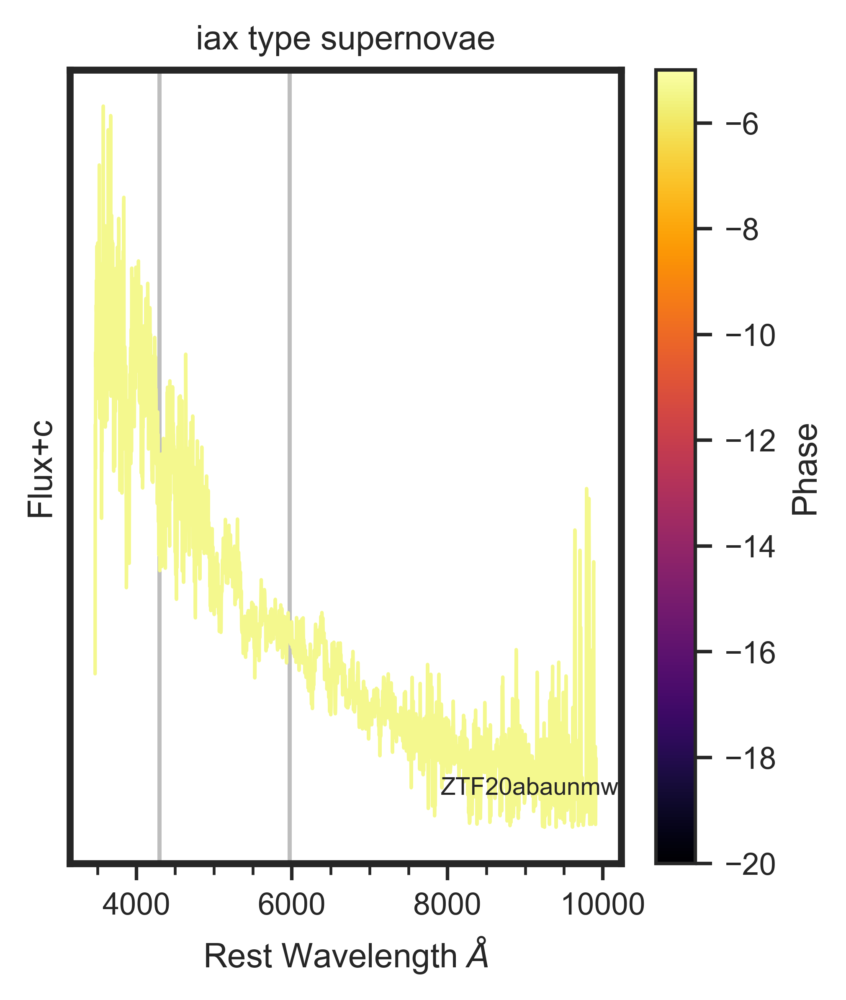

In [9]:
#iax
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)

fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_name = file_iax[0]
file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]
file_path = file_stem + slash + file_name
#print(file_path)
data = pd.read_csv(file_path)
wl = np.array(data['wl']) / (1+redshift_iax[0])
fl = np.array(data['fl'])
fl_mean = fl/np.mean(fl)

fl_nolow = []
wl_nolow = []

for i in range(len(fl_mean)):
    if fl_mean[i] >= 1e-2:
        fl_nolow.append(fl_mean[i])
        wl_nolow.append(wl[i])

fl_log = np.log10(fl_nolow)

sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_iax[0])
#sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax)
text = name_iax[0] #+ '\nphase = ' + str(phase_iax[0])[0:6]
ax.text(wl[int(0.69*len(wl))],fl_nolow[-1], text, fontsize=7)

ax.set_title('iax type supernovae')
#print(fl/np.mean(fl))
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'iax.png')

91bg

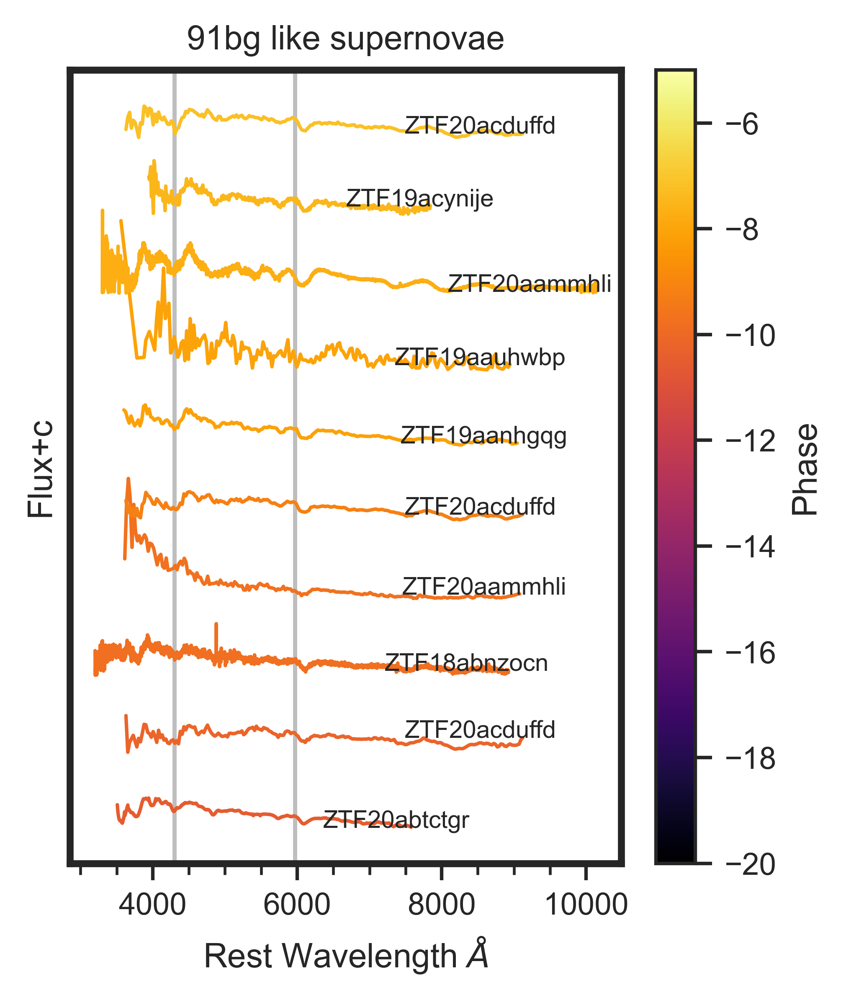

In [10]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_91bg_1)):
    file_path = file_stem + slash + file_91bg_1[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_91bg_1[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    #if i >=1:
    #    data_previous = pd.read_csv(file_stem + slash + file_91bg[i-1])
    #    #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #    fl_previous = np.array(data_previous['fl'])
    #    fl_previous_mean = fl_previous/np.mean(fl_previous)
    #    fl_previous_nolow = []
    #    #wl_previous_nolow = []
    #    for j in range(len(fl_previous_mean)):
    #        if fl_previous_mean[j] >= 1e-2:
    #            fl_previous_nolow.append(fl_previous_mean[j])
    #            #wl_previous_nolow.append(wl_previous[j])
    #    fl_previous_nolow = np.array(fl_previous_nolow)
    #    #wl_previous_nolow = np.array(wl_previous_nolow)
    #    for j in range(1000):
    #        a=0
    #        if min(fl_nolow) <= max(fl_previous_nolow):
    #            fl_nolow = fl_nolow + 0.1
    #            a+=1


    fl_nolow = fl_nolow + (i*5)
    #fl_log = np.log10(fl_nolow)
    phase = phase_91bg_1[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_91bg_1[i])#, label=lable)
    text = name_91bg_1[i] #+ '\nphase = ' + str(phase_91bg_1[i])[0:6]
    ax.text(wl[int(0.70*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('91bg like supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'91bgLike1.png')

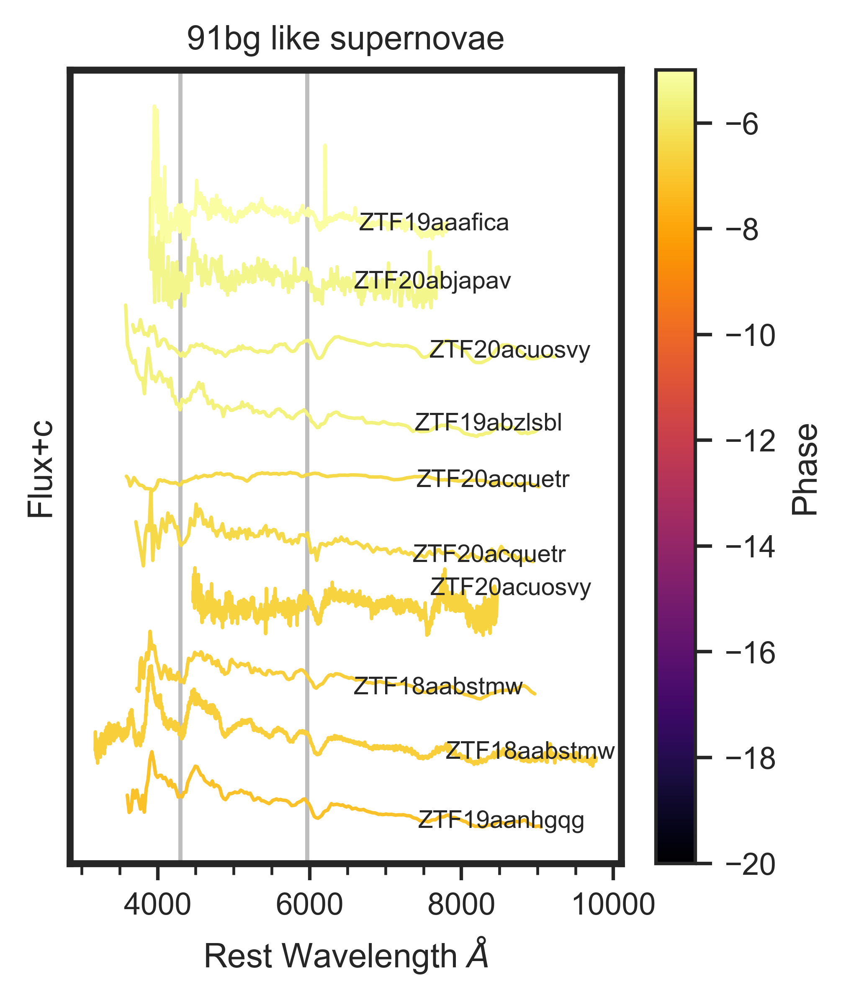

In [11]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_91bg_2)):
    file_path = file_stem + slash + file_91bg_2[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_91bg_2[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    #if i >=1:
    #    data_previous = pd.read_csv(file_stem + slash + file_91bg[i-1])
    #    #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #    fl_previous = np.array(data_previous['fl'])
    #    fl_previous_mean = fl_previous/np.mean(fl_previous)
    #    fl_previous_nolow = []
    #    #wl_previous_nolow = []
    #    for j in range(len(fl_previous_mean)):
    #        if fl_previous_mean[j] >= 1e-2:
    #            fl_previous_nolow.append(fl_previous_mean[j])
    #            #wl_previous_nolow.append(wl_previous[j])
    #    fl_previous_nolow = np.array(fl_previous_nolow)
    #    #wl_previous_nolow = np.array(wl_previous_nolow)
    #    for j in range(1000):
    #        a=0
    #        if min(fl_nolow) <= max(fl_previous_nolow):
    #            fl_nolow = fl_nolow + 0.1
    #            a+=1


    fl_nolow = fl_nolow + (i*2.5)
    #fl_log = np.log10(fl_nolow)
    phase = phase_91bg_2[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_91bg_2[i])#, label=lable)
    text = name_91bg_2[i] #+ '\nphase = ' + str(phase_91bg_2[i])[0:6]
    ax.text(wl[int(0.70*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('91bg like supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'91bgLike2.png')

normal

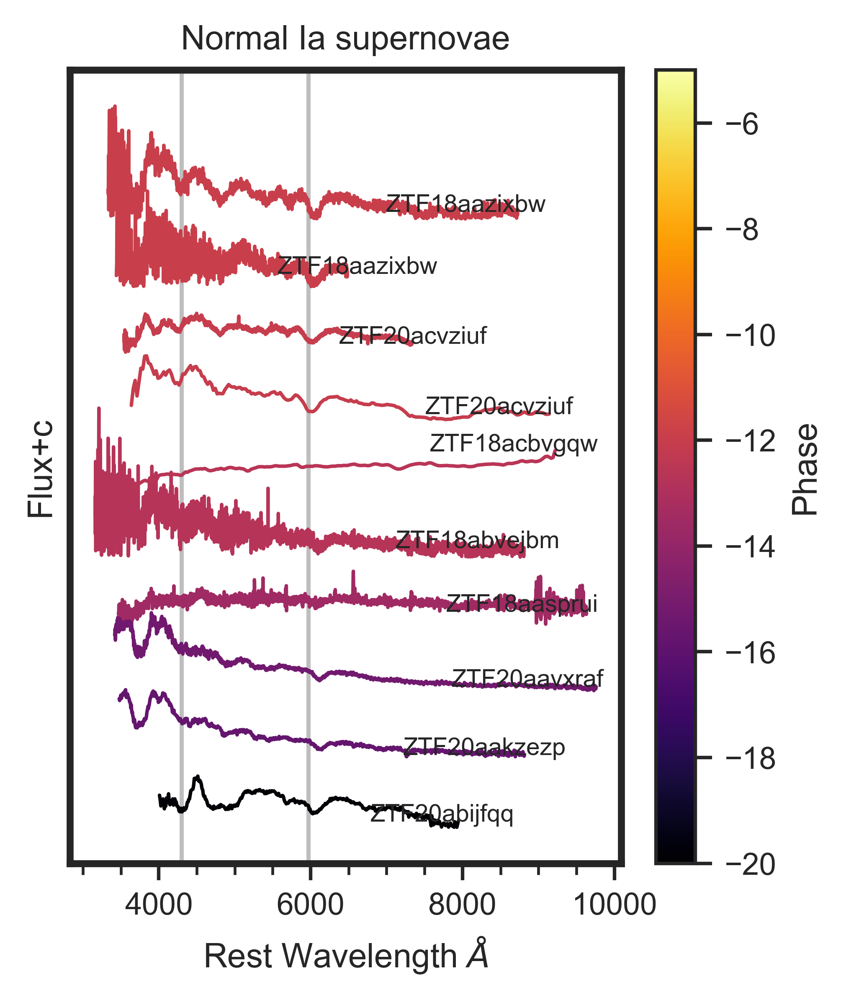

In [12]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_1)):
    file_path = file_stem + slash + file_normal_1[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_1[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            if fl_mean[j] <= 7:
                fl_nolow.append(fl_mean[j])
                wl_nolow.append(wl[j])
        
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*3)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_1[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_1[i])#, label=lable)
    text = name_normal_1[i] #+ '\nphase = ' + str(phase_normal_1[i])[0:6]
    ax.text(wl[int(0.70*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal1.png')

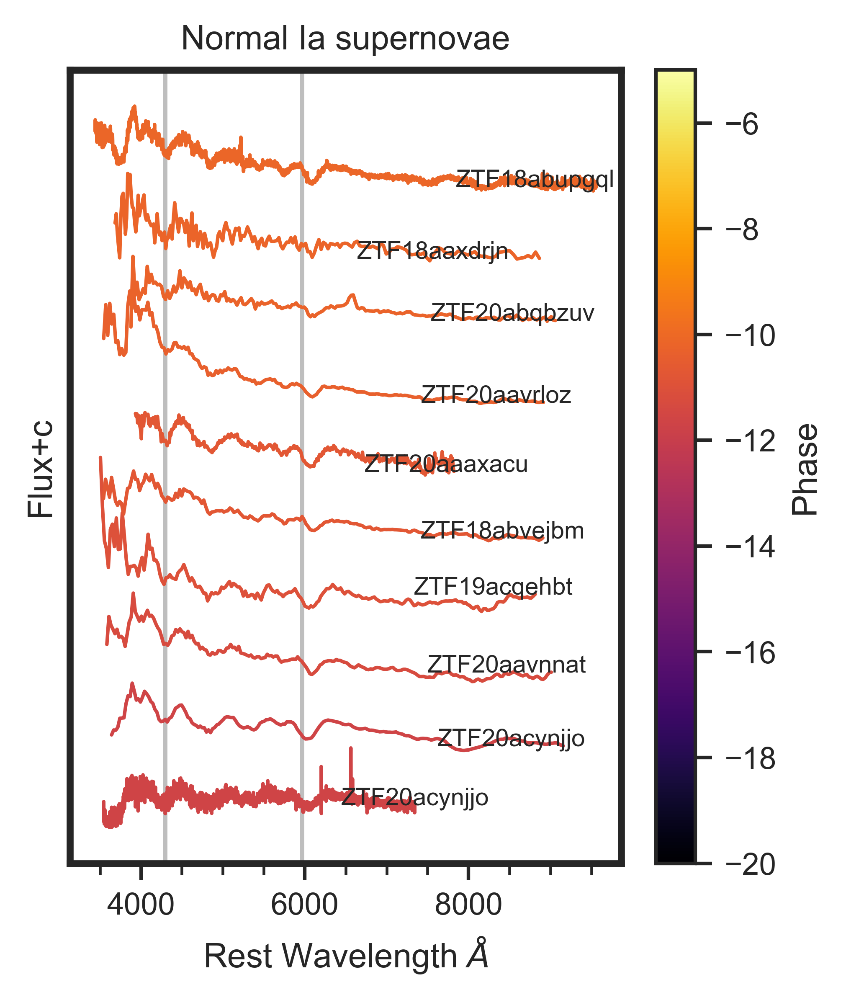

In [13]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_2)):
    file_path = file_stem + slash + file_normal_2[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_2[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_2[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_2[i])#, label=lable)
    text = name_normal_2[i] #+ '\nphase = ' + str(phase_normal_2[i])[0:6]
    ax.text(wl[int(0.72*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal2.png')

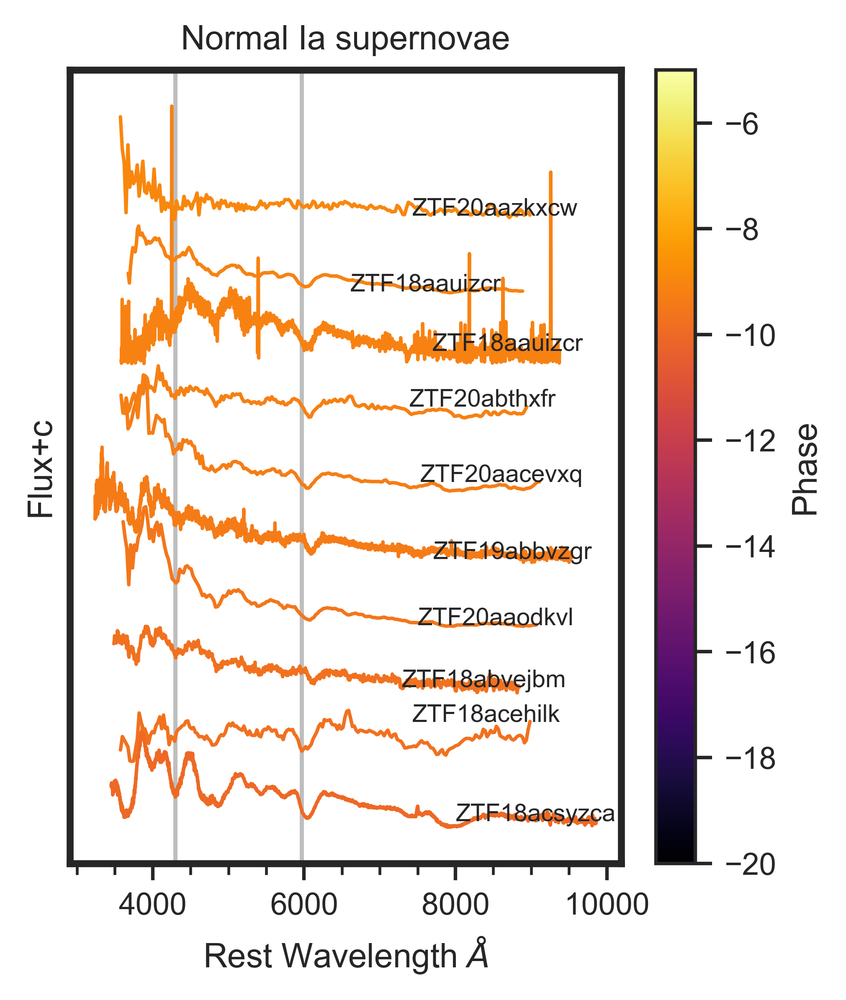

In [14]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_3)):
    file_path = file_stem + slash + file_normal_3[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_3[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_3[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_3[i])#, label=lable)
    text = name_normal_3[i] #+ '\nphase = ' + str(phase_normal_3[i])[0:6]
    ax.text(wl[int(0.71*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal3.png')

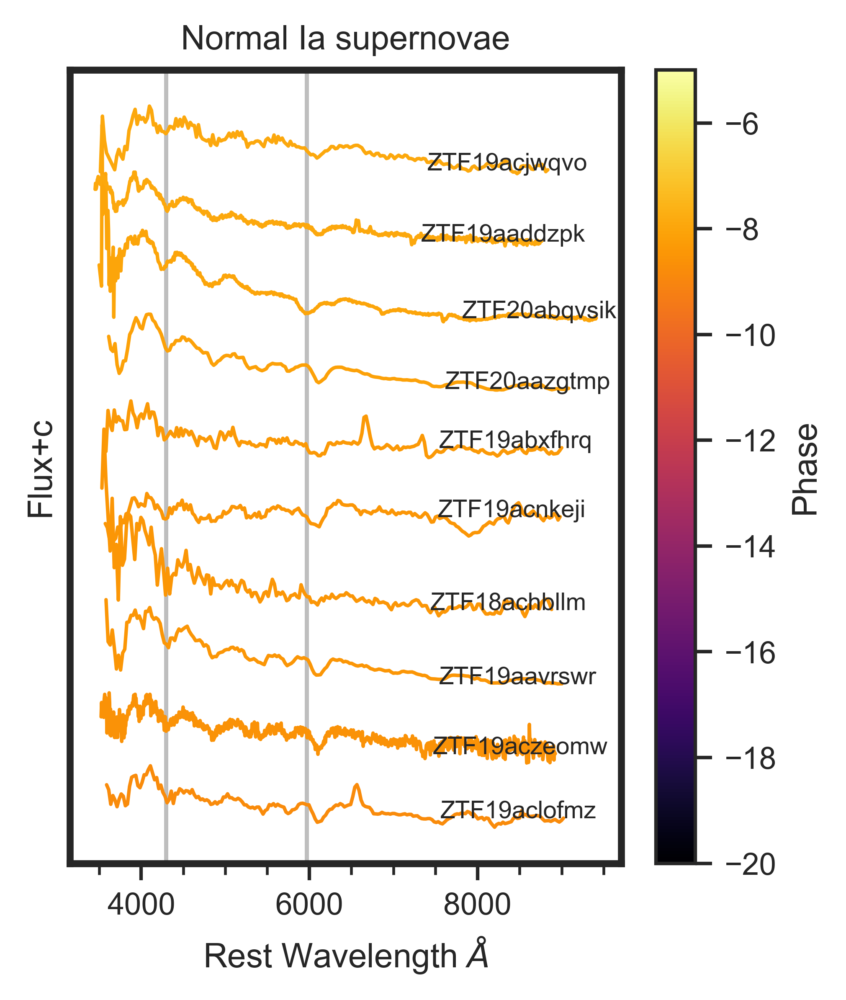

In [15]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_4)):
    file_path = file_stem + slash + file_normal_4[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_4[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            if fl_mean[j] <=7:
                fl_nolow.append(fl_mean[j])
                wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_4[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_4[i])#, label=lable)
    text = name_normal_4[i] #+ '\nphase = ' + str(phase_normal_4[i])[0:6]
    ax.text(wl[int(0.73*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal4.png')

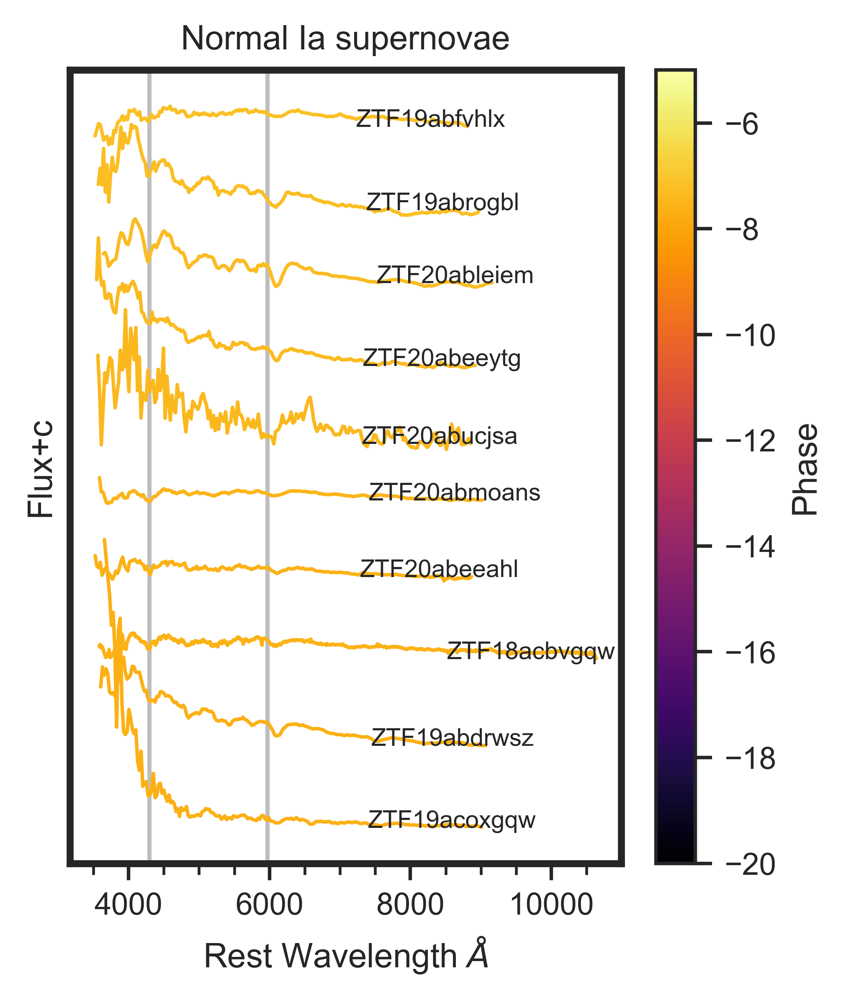

In [16]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_5)):
    file_path = file_stem + slash + file_normal_5[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_5[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            if fl_mean[j] <=10:
                fl_nolow.append(fl_mean[j])
                wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_5[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_5[i])#, label=lable)
    text = name_normal_5[i] #+ '\nphase = ' + str(phase_normal_5[i])[0:6]
    ax.text(wl[int(0.70*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal5.png')

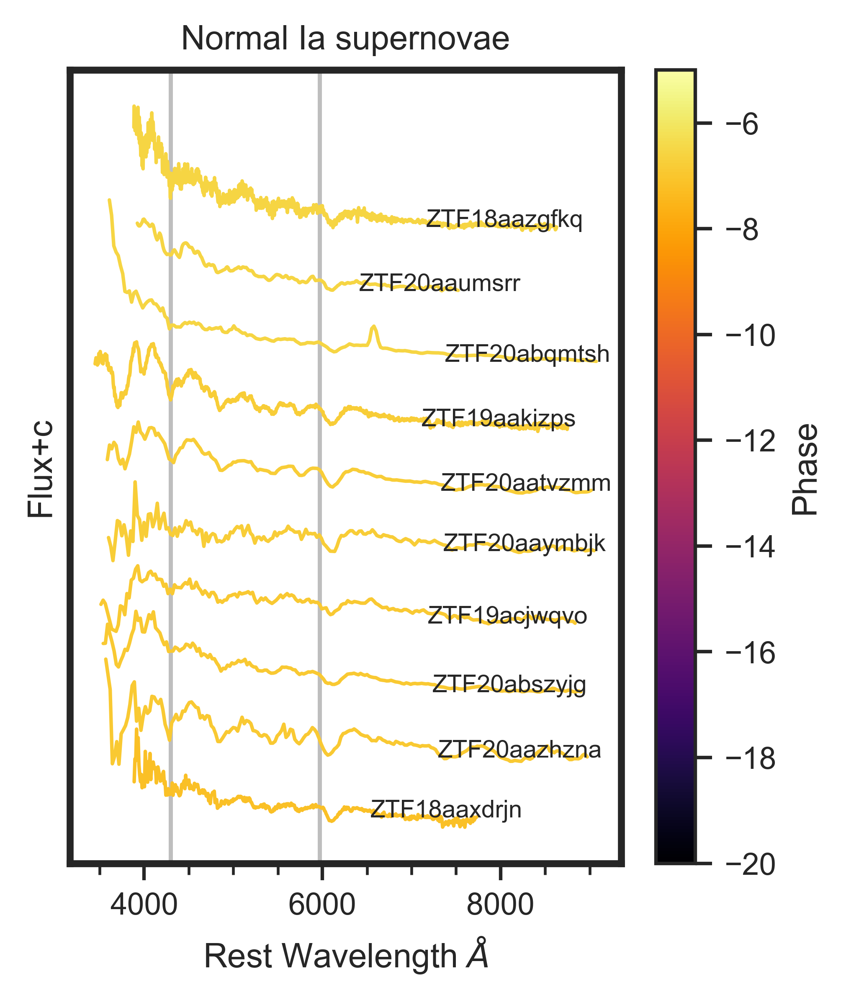

In [17]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_6)):
    file_path = file_stem + slash + file_normal_6[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_6[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_6[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_6[i])#, label=lable)
    text = name_normal_6[i] #+ '\nphase = ' + str(phase_normal_6[i])[0:6]
    ax.text(wl[int(0.69*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal6.png')

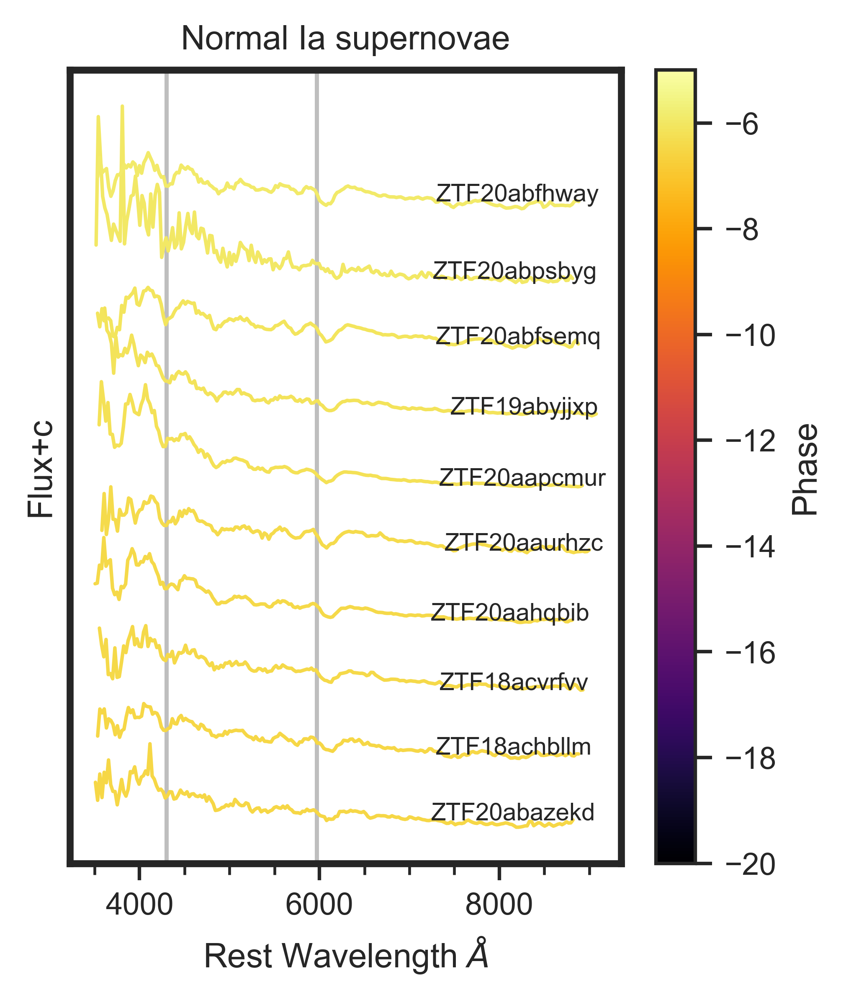

In [18]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_7)):
    file_path = file_stem + slash + file_normal_7[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_7[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*3)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_7[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_7[i])#, label=lable)
    text = name_normal_7[i] #+ '\nphase = ' + str(phase_normal_7[i])[0:6]
    ax.text(wl[int(0.70*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal7.png')

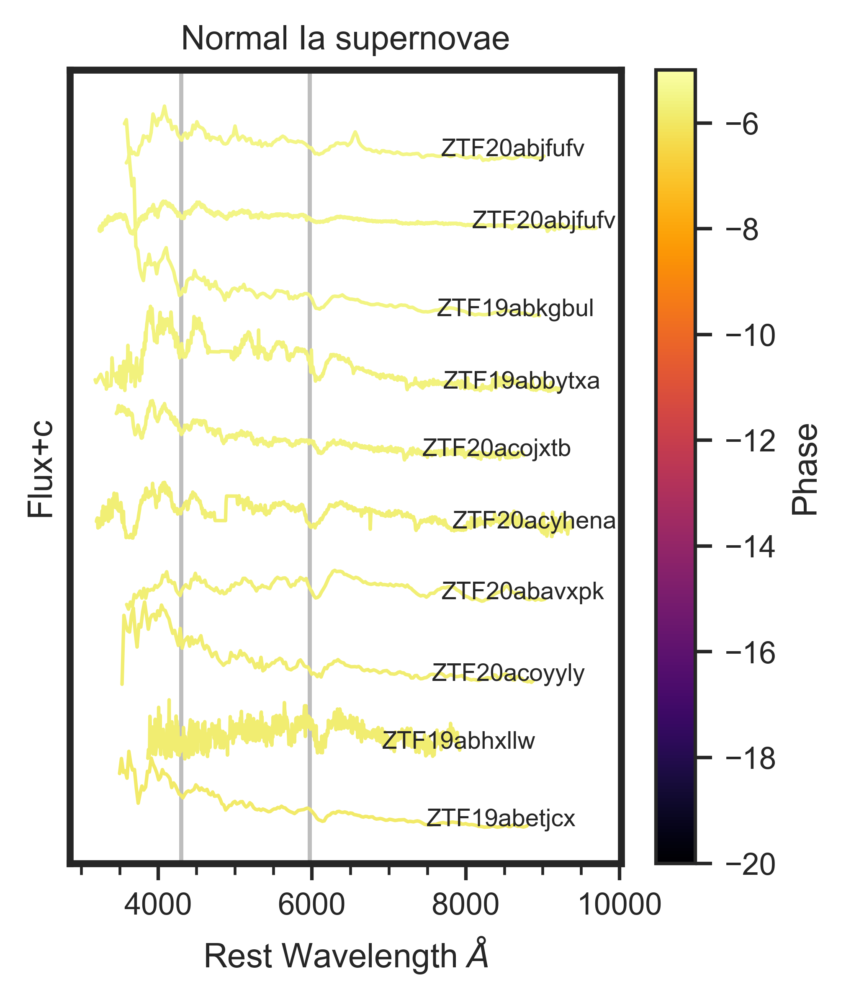

In [19]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_8)):
    file_path = file_stem + slash + file_normal_8[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_8[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            if fl_mean[j] <= 10:
                fl_nolow.append(fl_mean[j])
                wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*3)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_8[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_8[i])#, label=lable)
    text = name_normal_8[i] #+ '\nphase = ' + str(phase_normal_8[i])[0:6]
    ax.text(wl[int(0.75*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal8.png')

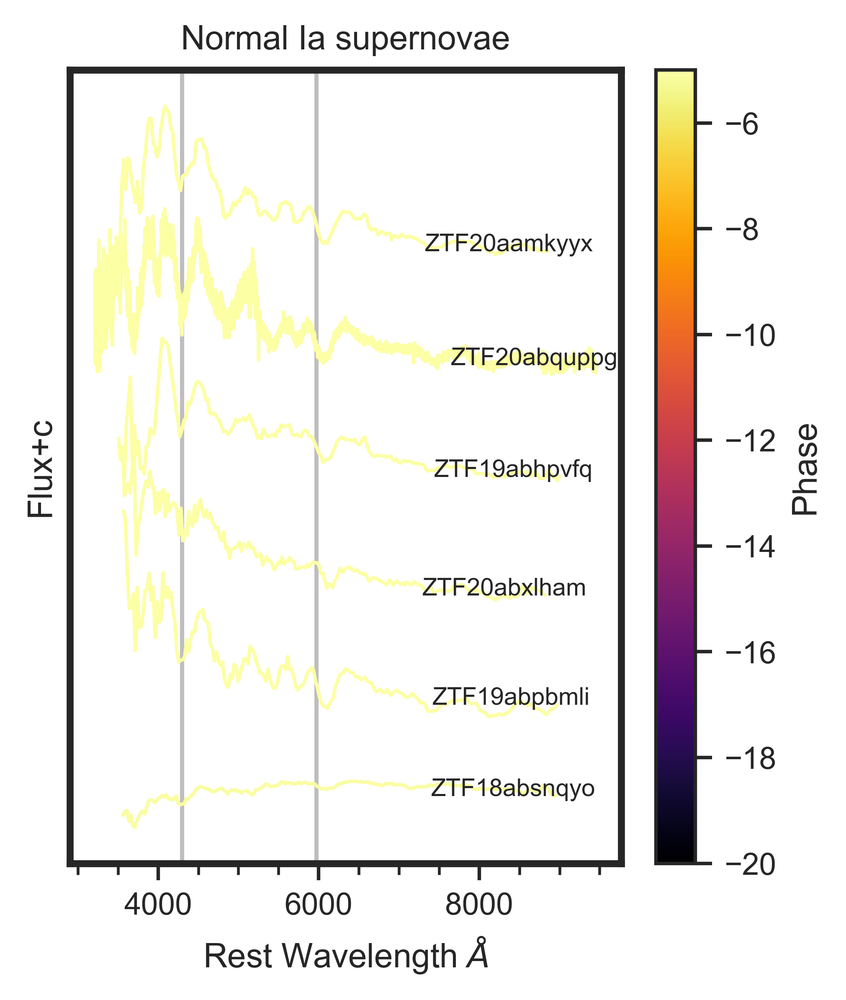

In [20]:
sns.set_style("ticks")
sns.set_context("paper", font_scale=1)
fig, ax = plt.subplots(figsize=(3.54, 4.1), dpi=600)

for axis in ['top', 'bottom', 'left', 'right']:
    plt.gca().spines[axis].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(AutoMinorLocator())
plt.gca().yaxis.set_minor_locator(AutoMinorLocator())
ax.axvline(x=4300, color='tab:gray', alpha=0.5)
ax.axvline(x=5972, color='tab:gray', alpha=0.5)
ax.set_yticks([], minor=False)
ax.minorticks_on()
ax.yaxis.set_minor_locator(plt.NullLocator())
ax.set_xlabel('Rest Wavelength $\AA$')
ax.set_ylabel('Flux+c')

file_stem = r"C:\Users\senan\OneDrive\Desktop\Capstone\dereddened_spectra_and_Ti_figures"
slash = 'hello\goodbye'[5]

for i in range(len(name_normal_9)):
    file_path = file_stem + slash + file_normal_9[i]
    data = pd.read_csv(file_path)
    wl = np.array(data['wl']) / (1+redshift_normal_9[i])
    fl = np.array(data['fl'])
    fl_mean = fl/np.mean(fl)
    fl_nolow = []
    wl_nolow = []
    for j in range(len(fl_mean)):
        if fl_mean[j] >= 1e-2:
            fl_nolow.append(fl_mean[j])
            wl_nolow.append(wl[j])
    fl_nolow = np.array(fl_nolow)
    wl_nolow = np.array(wl_nolow)

    # if i >=1:
    #     data_previous = pd.read_csv(file_stem + slash + file_normal[i-1])
    #     #wl_previous = np.array(data_previous['wl']) / (1+redshift_04gs[i-1])
    #     fl_previous = np.array(data_previous['fl'])
    #     fl_previous_mean = fl_previous/np.mean(fl_previous)
    #     fl_previous_nolow = []
    #     #wl_previous_nolow = []
    #     for j in range(len(fl_previous_mean)):
    #         if fl_previous_mean[j] >= 1e-2:
    #             fl_previous_nolow.append(fl_previous_mean[j])
    #             #wl_previous_nolow.append(wl_previous[j])
    #     fl_previous_nolow = np.array(fl_previous_nolow)
    #     #wl_previous_nolow = np.array(wl_previous_nolow)
    #     for j in range(1000):
    #         a=0
    #         if min(fl_nolow) <= max(fl_previous_nolow):
    #             fl_nolow = fl_nolow + 0.1
    #             a+=1

    fl_nolow = fl_nolow + (i*2.5)

    #fl_log = np.log10(fl_nolow)
    phase = phase_normal_9[i]
    lable = 'phase = ' + str(phase)
    #sns.lineplot(x=wl_nolow, y=fl_log, linestyle='-', linewidth =1, ax=ax, label=lable)
    sns.lineplot(x=wl_nolow, y=fl_nolow, linestyle='-', linewidth =1, ax=ax, color=colors_normal_9[i])#, label=lable)
    text = name_normal_9[i] #+ '\nphase = ' + str(phase_normal_9[i])[0:6]
    ax.text(wl[int(0.71*len(wl))],fl_nolow[-1], text, fontsize=7)
ax.set_title('Normal Ia supernovae')
sm = plt.cm.ScalarMappable(cmap='inferno', norm=norm)
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Phase')
#plt.savefig(r'C:\Users\senan\OneDrive\Desktop\Capstone\spectra_figures' + slash +'normal9.png')